In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam

# Import Data

In [2]:
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

In [3]:
data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Revisi%20Analisis/Data%20TMA%20(Jan%202022%20-%20Juni%202025).csv')
data = data.loc[:, ['Daily_Period','TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

print(data.head())
print(data.tail())
print(data.shape)

  Daily_Period  TMA_Daily
0   01/01/2022       10.0
1   02/01/2022       10.0
2   03/01/2022       10.0
3   04/01/2022       10.0
4   05/01/2022       12.5
     Daily_Period  TMA_Daily
1210   25/04/2025  20.000000
1211   26/04/2025  20.000000
1212   27/04/2025  20.000000
1213   28/04/2025  21.666667
1214   29/04/2025  20.000000
(1215, 2)


# Eksplorasi Data

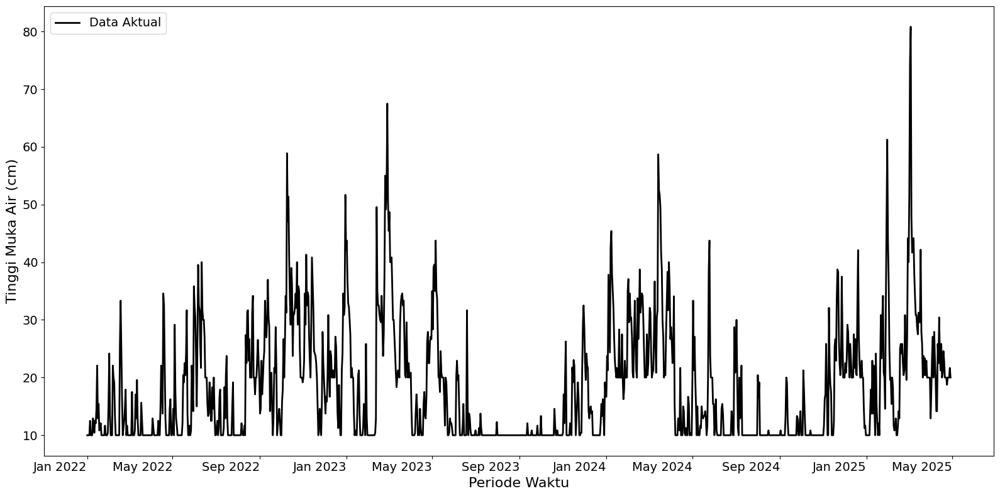

Dimension of full data: (1215, 2)


In [4]:
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, DateFormatter
import pandas as pd

# Pastikan kolom waktu dalam format datetime
data['Daily_Period'] = pd.to_datetime(data['Daily_Period'], format='%d/%m/%Y')

# Membuat plot seluruh data tanpa split
plt.figure(figsize=(16, 8))
plt.plot(data['Daily_Period'], data['TMA_Daily'], lw=2, color='black', label='Data Aktual')

# Label dan format
plt.xlabel('Periode Waktu', fontsize=16)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=16)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set axis locator dan format tanggal
plt.gca().xaxis.set_major_locator(MonthLocator(bymonth=[1, 5, 9]))
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))

# Format rotasi tanggal
plt.gcf().autofmt_xdate(rotation=0)

# Tambahkan legend
plt.legend(fontsize=14)
# plt.title('Plot Seluruh Data Time Series TMA', fontsize=18)

plt.tight_layout()
plt.show()

# Print dimensi total
print('Dimension of full data:', data.shape)

# Normalisasi Data

Proses normalisasi data dilakukan menggunakan metode min-max normalization hingga menghasilkan data yang berskala [0,1].

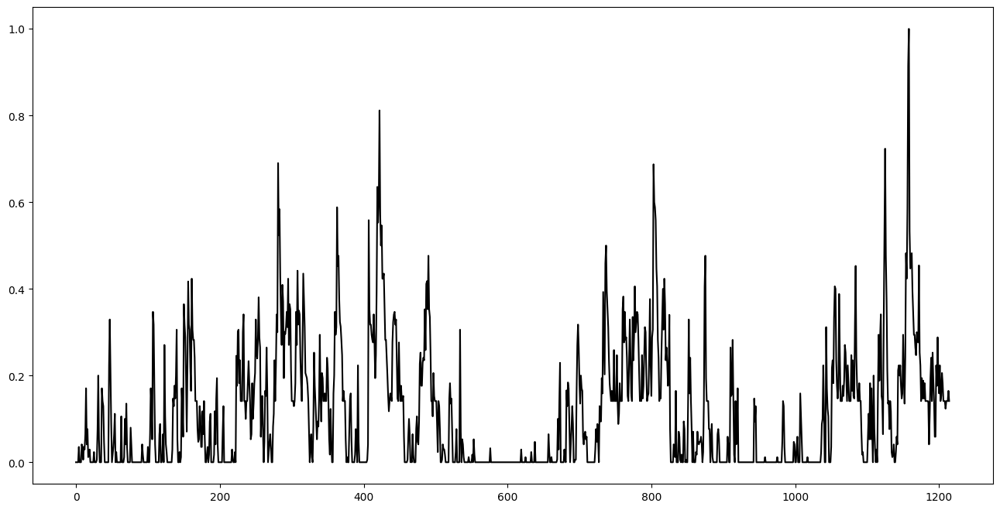

In [5]:
# Step 1: Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
data['TMA_normalized'] = scaler.fit_transform(data['TMA_Daily'].values.reshape(-1, 1))
plt.figure(figsize=(16, 8))
plt.plot(data['TMA_normalized'], color='black')

In [6]:
print(data['TMA_normalized'].head())
print(data['TMA_normalized'].tail())

0    0.000000
1    0.000000
2    0.000000
3    0.000000
4    0.035294
Name: TMA_normalized, dtype: float64
1210    0.141176
1211    0.141176
1212    0.141176
1213    0.164706
1214    0.141176
Name: TMA_normalized, dtype: float64


# Hyperparameter Tuning & Cross Validation

Hyperparameter tuning dilakukan untuk menentukan hyperparameter terbaik melalui langkah validasi berupa *time series k-fold cross validation*. Banyaknya fold yang digunakan dalam langkah validasi adalah sebanyak k = 5 fold.

In [7]:
data_series = data['TMA_normalized'].values
data_series = data_series.reshape((len(data_series), 1))
data_series

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.14117647],
       [0.16470588],
       [0.14117647]])

In [8]:
from tensorflow.keras.initializers import HeUniform, GlorotUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Pilih initializer berdasarkan parameter
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    elif init_scheme == 'glorot_uniform':
        initializer = GlorotUniform()
    else:
        raise ValueError("init_scheme harus 'he_uniform' atau 'glorot_uniform'")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(30, 1),
        return_sequences=True,
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(LSTM(
        50,
        activation='tanh',
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1, kernel_initializer=initializer, bias_initializer='zeros'))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [9]:
import keras

class EarlyStoppingAtMinLoss(keras.callbacks.Callback):
    """Stop training when the loss is at its min, i.e. the loss stops decreasing.

    Arguments:
        patience: Number of epochs to wait after min has been hit. After this
        number of no improvement, training stops.
    """

    def __init__(self, patience=0):
        super().__init__()
        self.patience = patience
        # best_weights to store the weights at which the minimum loss occurs.
        self.best_weights = None

    def on_train_begin(self, logs=None):
        # The number of epoch it has waited when loss is no longer minimum.
        self.wait = 0
        # The epoch the training stops at.
        self.stopped_epoch = 0
        # Initialize the best as infinity.
        self.best = np.inf

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get("val_loss")
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            # print('abcd')
            # Record the best weights if current results is better (less).
            self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                print("Restoring model weights from the end of the best epoch.")
                self.model.set_weights(self.best_weights)

    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print("Epoch %05d: early stopping" % (self.stopped_epoch + 1))

## Expanding Window Cross Validation

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0691 - val_loss: 0.0231
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0145 - val_loss: 0.0381
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0097 - val_loss: 0.0368
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0065 - val_loss: 0.0327
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0081 - val_loss: 0.0365
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0073Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0073 - val_loss: 0.0338
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 49.16681203652782 %
mape test = 82.98895237073253 %


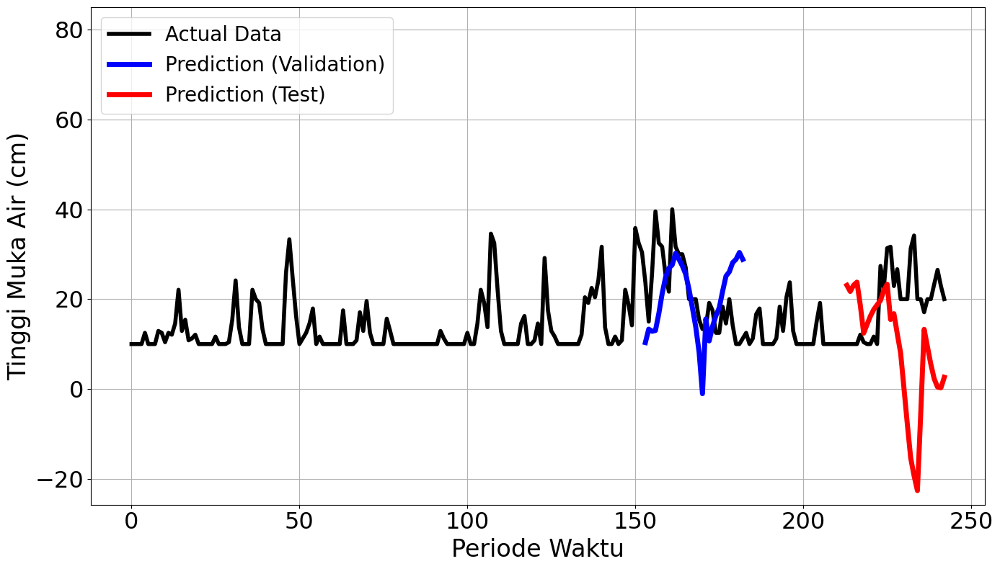

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0552 - val_loss: 0.0274
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - loss: 0.0146 - val_loss: 0.0576
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.0113 - val_loss: 0.0188
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.0095 - val_loss: 0.0204
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0086 - val_loss: 0.0281
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 9s 17ms/step - loss: 0.0087 - val_loss: 0.0326
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0090 - val_loss: 0.0313
Epoch 8/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0067Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0067 - val_loss: 0.0333
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 29.451042235021763 %
mape test = 41.44265536821596 %


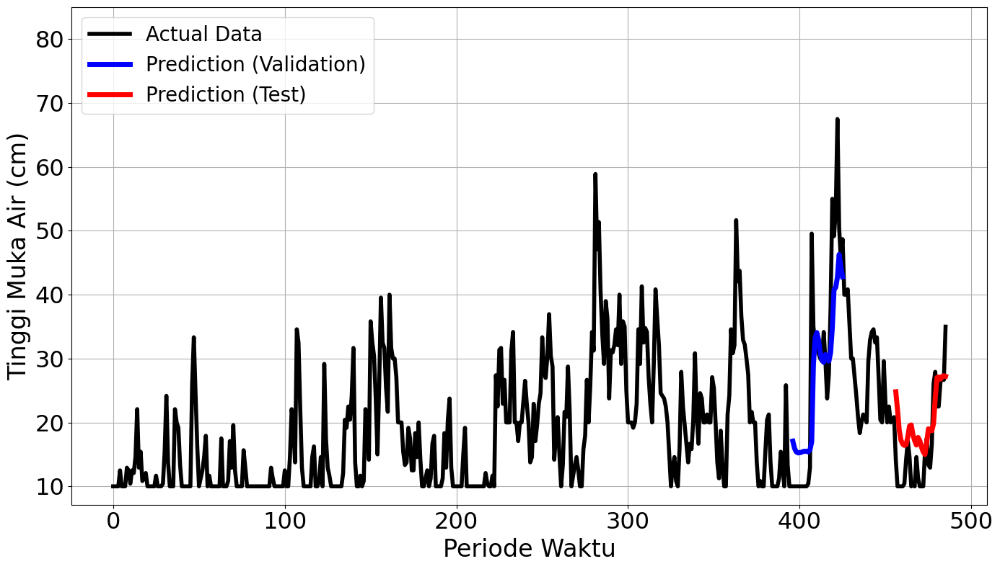

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0503 - val_loss: 2.7496e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - loss: 0.0133 - val_loss: 5.0674e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0103 - val_loss: 0.0014
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0097 - val_loss: 0.0037
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0089 - val_loss: 8.9231e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step - loss: 0.0085 - val_loss: 1.9993e-04
Epoch 7/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.0076 - val_loss: 1.9473e-04
Epoch 8/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0081 - val_loss: 0.0027
Epoch 9/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0072 - val_loss: 0.0014
Epoch 10/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 19ms/step - loss: 0.0075 - val_loss: 3.1772e-04
Epoch 11/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0060 - val_loss: 2.2936e-04
Epo

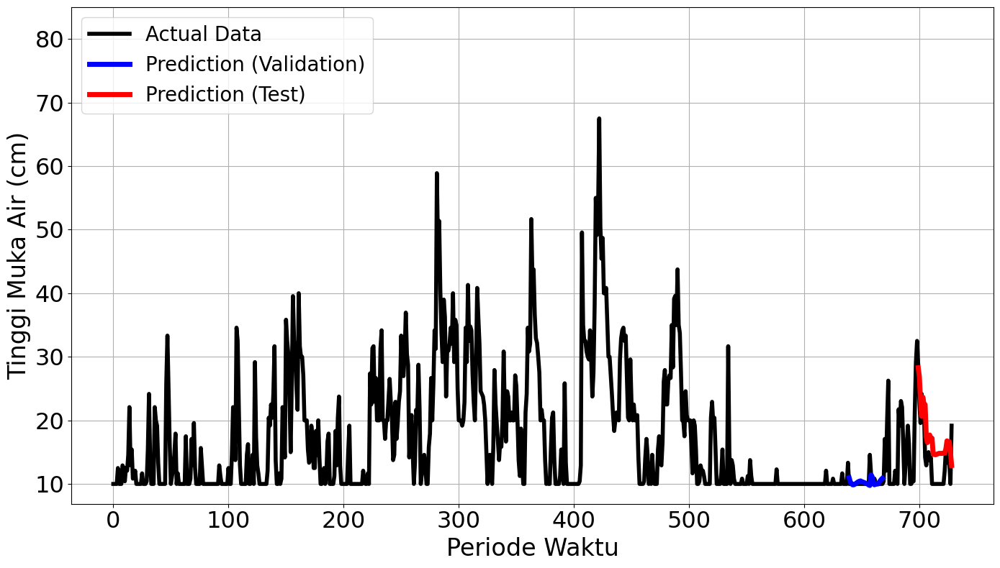

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0351 - val_loss: 0.0062
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 16s 19ms/step - loss: 0.0079 - val_loss: 0.0116
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0082 - val_loss: 0.0125
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 19s 19ms/step - loss: 0.0065 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 16s 19ms/step - loss: 0.0084 - val_loss: 0.0037
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 21s 19ms/step - loss: 0.0070 - val_loss: 0.0092
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0073 - val_loss: 0.0039
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 16s 19ms/step - loss: 0.0072 - val_loss: 0.0063
Epoch 9/100
821/822 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0058Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0058 - val_loss: 0.0038
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5m

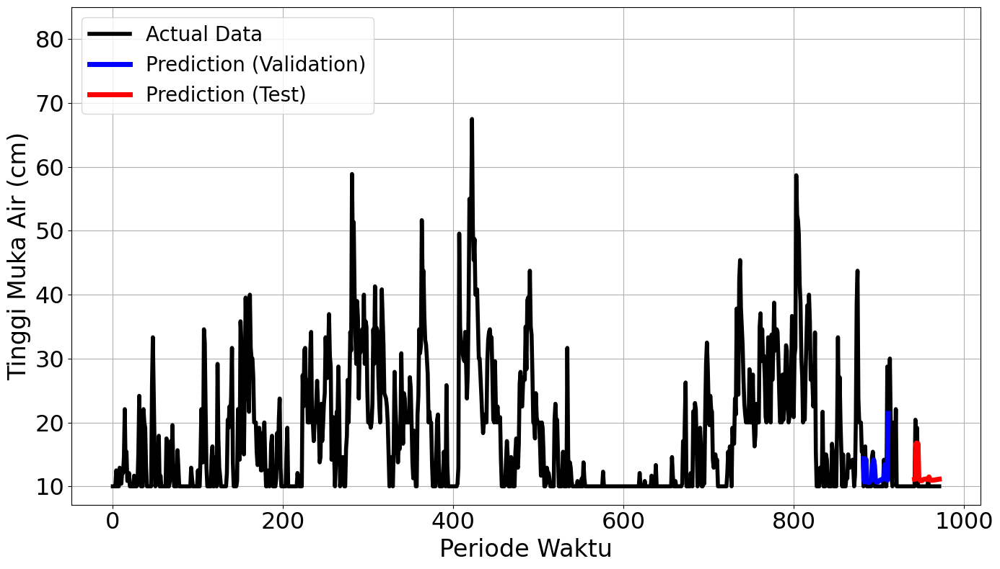

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0424 - val_loss: 0.0145
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 19ms/step - loss: 0.0089 - val_loss: 0.0108
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0074 - val_loss: 0.0099
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0073 - val_loss: 0.0097
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 42s 21ms/step - loss: 0.0061 - val_loss: 0.0100
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 19ms/step - loss: 0.0073 - val_loss: 0.0129
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 42s 21ms/step - loss: 0.0067 - val_loss: 0.0152
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 21s 19ms/step - loss: 0.0065 - val_loss: 0.0097
Epoch 9/100
1063/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 42s 21ms/step - loss: 0.0055 - val_loss: 0.0098
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
30/30 ━━━━━━

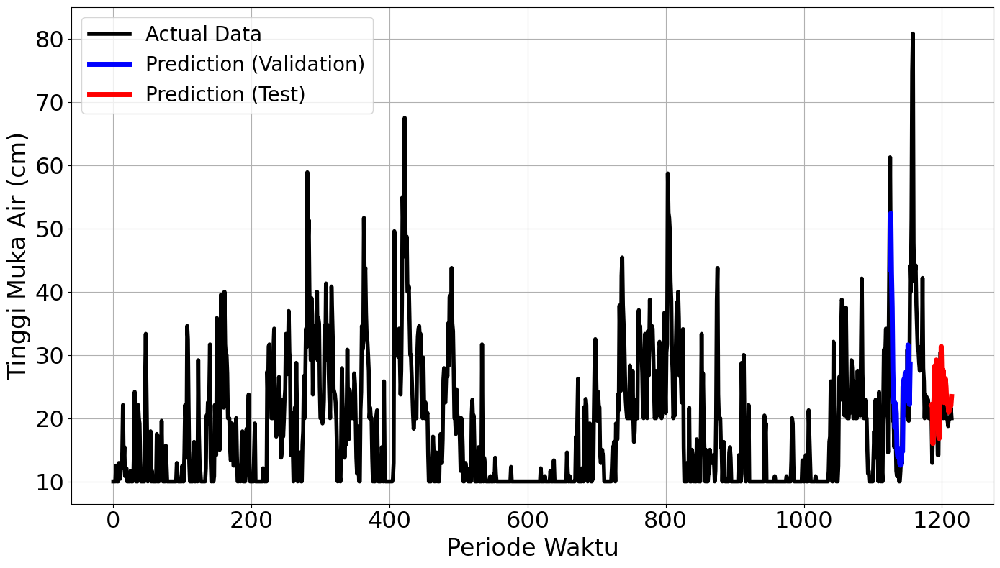

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2461
Final Average MAPE Test: 0.3796
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.0691 - val_loss: 0.0231
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0145 - val_loss: 0.0381
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0097 - val_loss: 0.0368
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - val_loss: 0.0327
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0081 - val_loss: 0.0365
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0073Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0073 - val_loss: 0.0338
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 49.16681203652782 %
mape test = 82.98895237073253 %


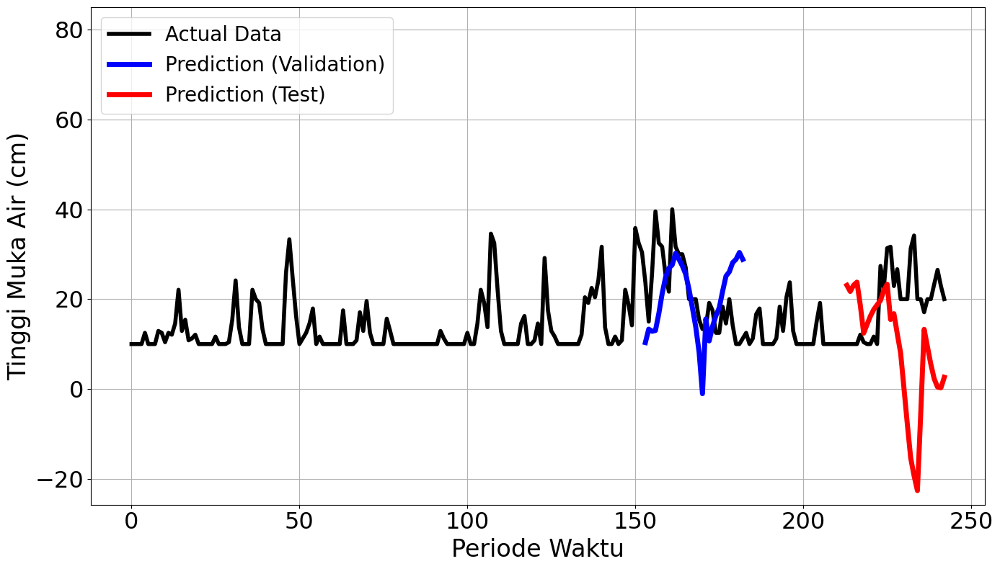

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0552 - val_loss: 0.0274
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0146 - val_loss: 0.0576
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0113 - val_loss: 0.0188
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - loss: 0.0095 - val_loss: 0.0204
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0086 - val_loss: 0.0281
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0087 - val_loss: 0.0326
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0090 - val_loss: 0.0313
Epoch 8/100
335/336 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0067Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0067 - val_loss: 0.0333
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
mape validation = 29.451042235021763 %
mape test = 41.44265536821596 %


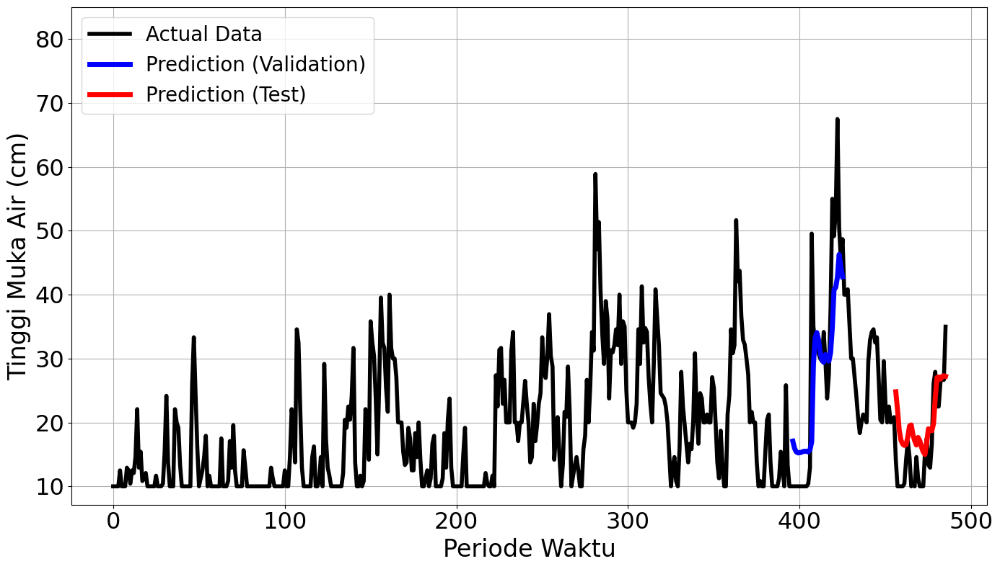

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0503 - val_loss: 2.7496e-04
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0133 - val_loss: 5.0674e-04
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0103 - val_loss: 0.0014
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0097 - val_loss: 0.0037
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0089 - val_loss: 8.9231e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0085 - val_loss: 1.9993e-04
Epoch 7/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0076 - val_loss: 1.9473e-04
Epoch 8/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0081 - val_loss: 0.0027
Epoch 9/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0072 - val_loss: 0.0014
Epoch 10/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0075 - val_loss: 3.1772e-04
Epoch 11/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0060 - val_loss: 2.2936e-04
Epo

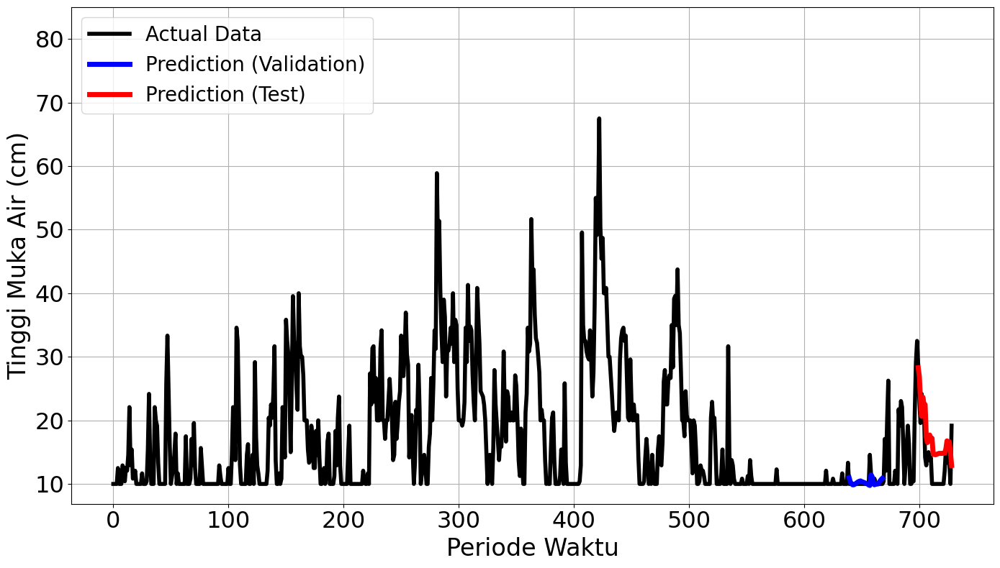

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0351 - val_loss: 0.0062
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0079 - val_loss: 0.0116
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0082 - val_loss: 0.0125
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0065 - val_loss: 0.0028
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0084 - val_loss: 0.0037
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0070 - val_loss: 0.0092
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0073 - val_loss: 0.0039
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0072 - val_loss: 0.0063
Epoch 9/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0058Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0058 - val_loss: 0.0038
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5m

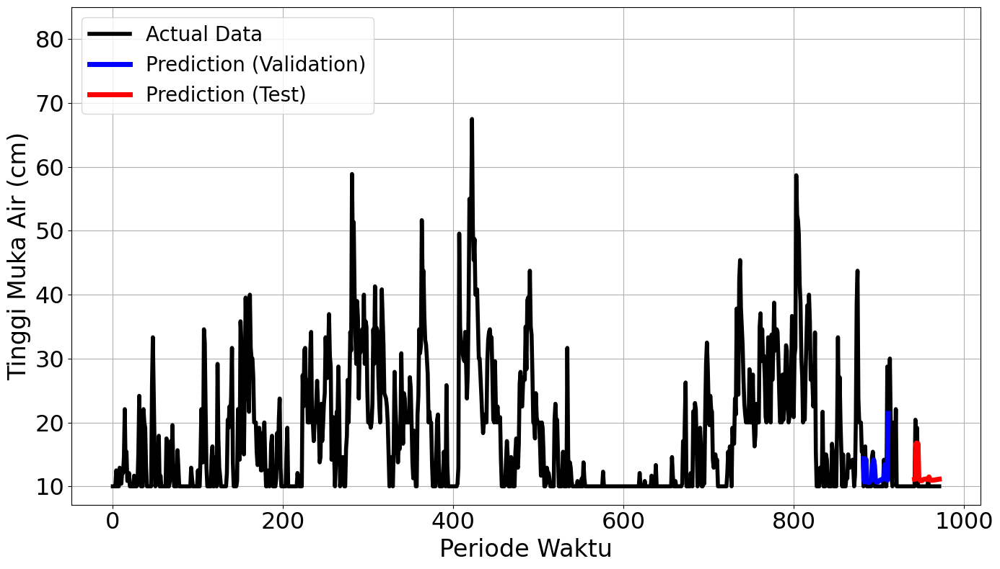

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0424 - val_loss: 0.0145
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 42s 22ms/step - loss: 0.0089 - val_loss: 0.0108
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0074 - val_loss: 0.0099
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 42s 22ms/step - loss: 0.0073 - val_loss: 0.0097
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 41s 22ms/step - loss: 0.0061 - val_loss: 0.0100
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 41s 22ms/step - loss: 0.0073 - val_loss: 0.0129
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0067 - val_loss: 0.0152
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0065 - val_loss: 0.0097
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0055Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0055 - val_loss: 0.0098
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
30/30 ━━━━━━

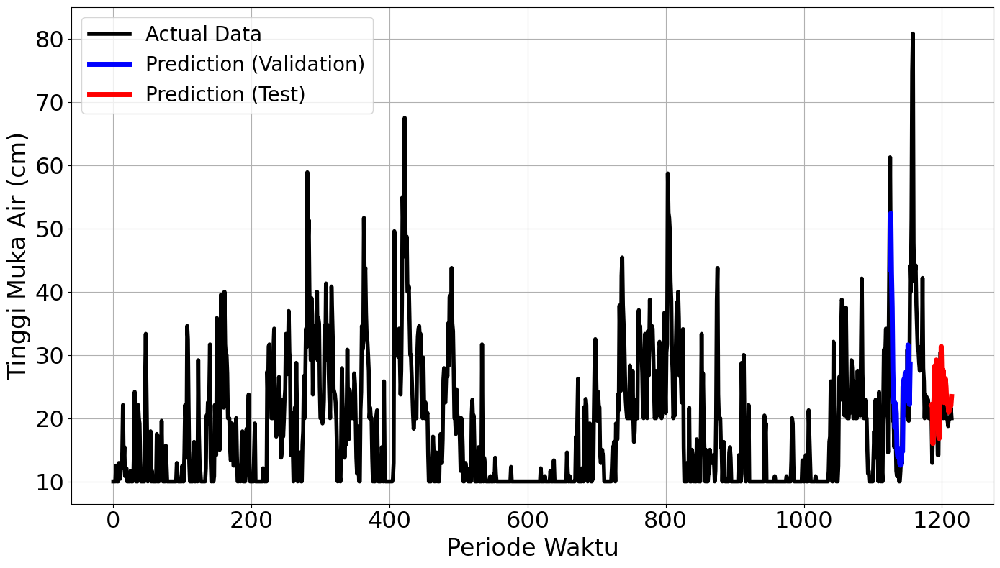

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2461
Final Average MAPE Test: 0.3796
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 173ms/step - loss: 0.2890 - val_loss: 0.0389
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0295 - val_loss: 0.1624
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0359 - val_loss: 0.1567
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0149 - val_loss: 0.1534
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0112 - val_loss: 0.1750
Epoch 6/100
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0106 - val_loss: 0.2389
Epoch 00006: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 305ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
mape validation = 65.00732820480616 %
mape test = 127.69522318391846 %


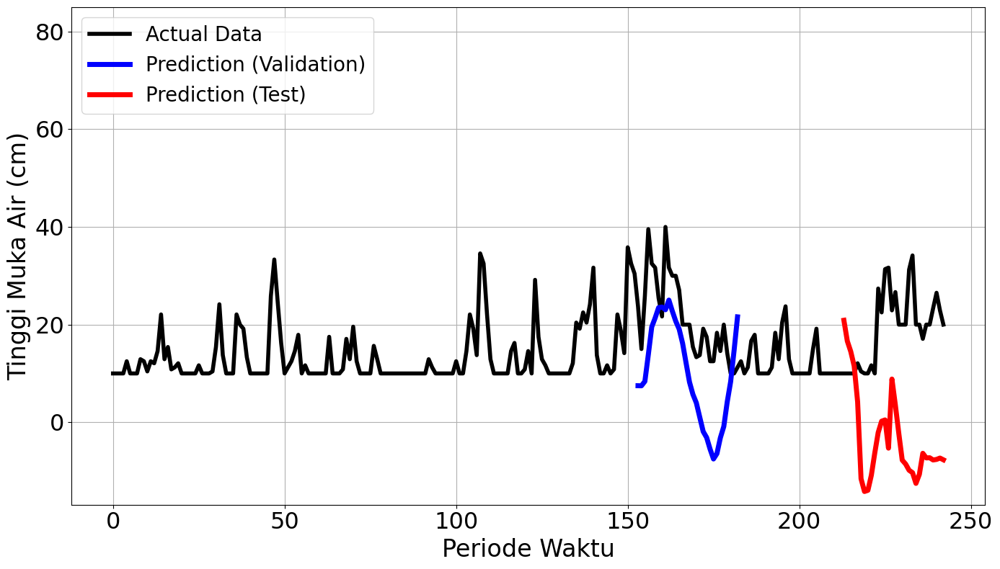

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.1561 - val_loss: 0.0679
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0369 - val_loss: 0.0913
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0184 - val_loss: 0.0616
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0184 - val_loss: 0.0555
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0113 - val_loss: 0.0623
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0117 - val_loss: 0.0650
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0117 - val_loss: 0.0643
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0146 - val_loss: 0.0655
Epoch 9/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0092 - val_loss: 0.0555
Epoch 10/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0105 - val_loss: 0.0501
Epoch 11/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0126 - val_loss: 0.0488
Epoch 12/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 329ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
mape validation = 27.60114617206891 %
mape test = 28.577460937066135 %


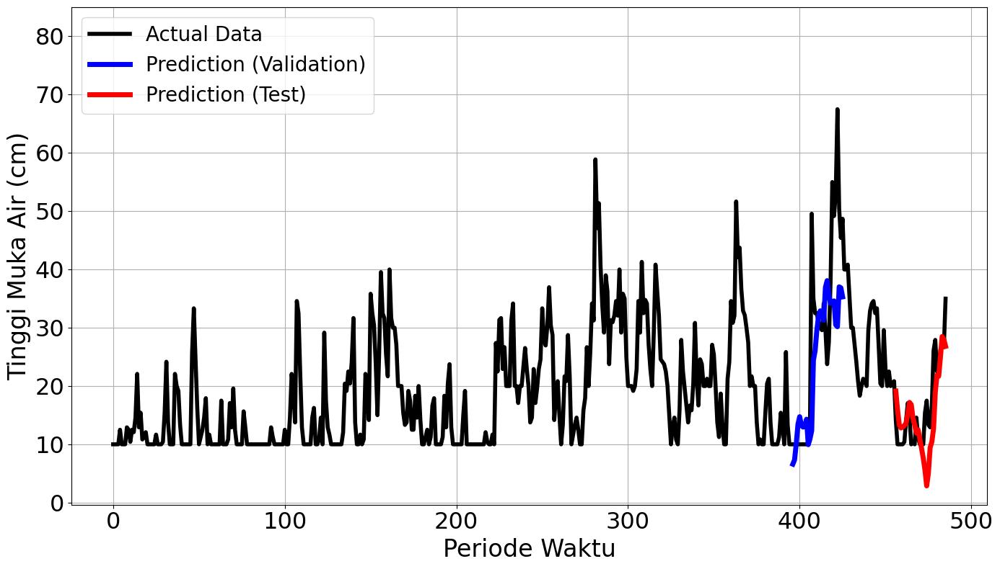

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


37/37 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1289 - val_loss: 0.0538
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0263 - val_loss: 3.5217e-04
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0116 - val_loss: 5.1108e-04
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0107 - val_loss: 8.1100e-04
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0119 - val_loss: 0.0011
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0092 - val_loss: 0.0029
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0088Restoring model weights from the end of the best epoch.
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0089 - val_loss: 0.0022
Epoch 00007: early stopping


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 489ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
mape validation = 7.91595530107589 %
mape test = 50.97217262872905 %


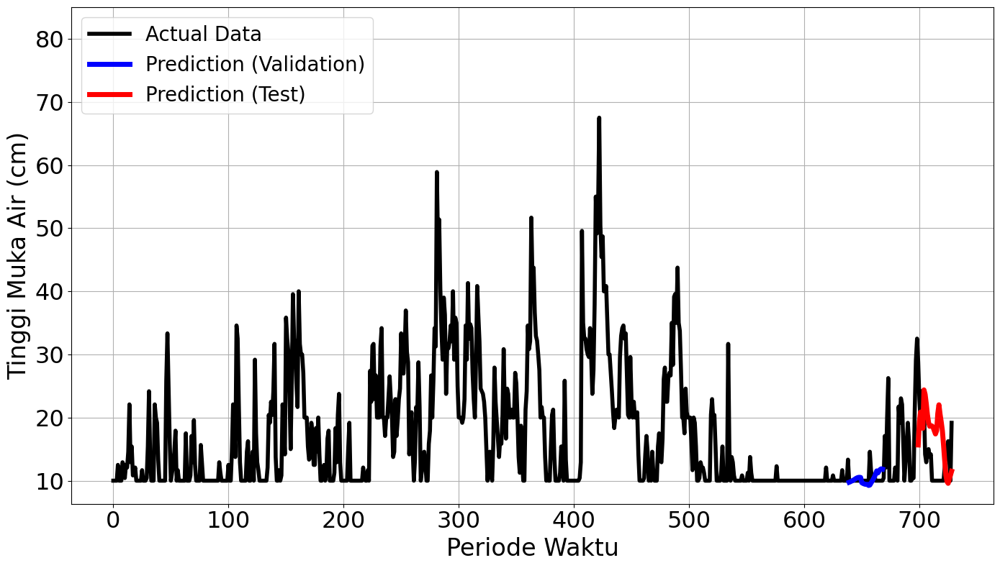

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


52/52 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.1394 - val_loss: 0.0078
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0162 - val_loss: 0.0054
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0106 - val_loss: 0.0066
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.0106 - val_loss: 0.0063
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0095 - val_loss: 0.0056
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0086 - val_loss: 0.0049
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0088 - val_loss: 0.0051
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0101 - val_loss: 0.0057
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0088 - val_loss: 0.0033
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0086 - val_loss: 0.0040
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0078 - val_loss: 0.0037
Epoch 12/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0

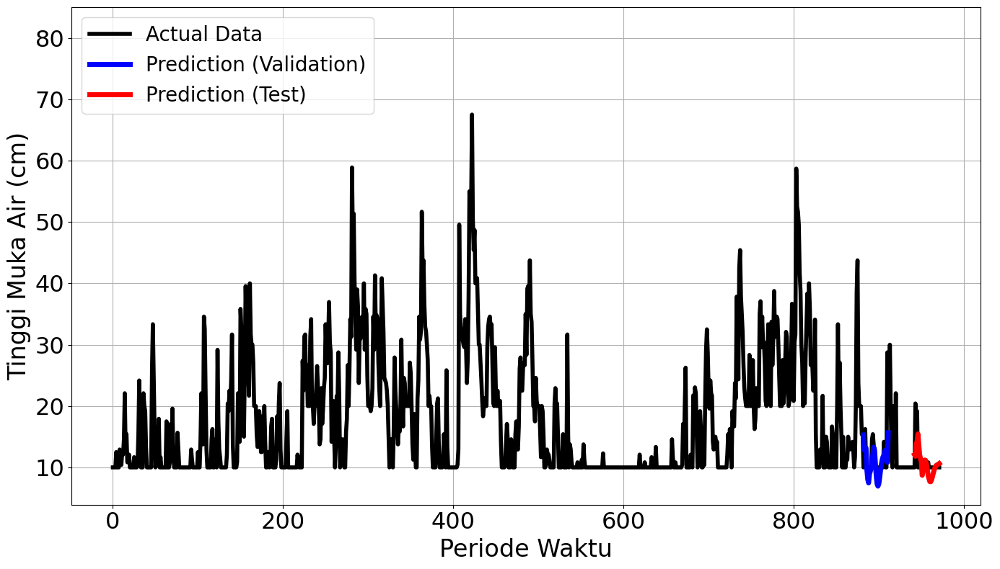

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.1041 - val_loss: 0.0457
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0195 - val_loss: 0.0208
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0097 - val_loss: 0.0190
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0111 - val_loss: 0.0145
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0088 - val_loss: 0.0139
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0105 - val_loss: 0.0129
Epoch 7/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0100 - val_loss: 0.0129
Epoch 8/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0080 - val_loss: 0.0157
Epoch 9/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0088 - val_loss: 0.0116
Epoch 10/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0069 - val_loss: 0.0182
Epoch 11/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0100 - val_loss: 0.0120
Epoch 12/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0

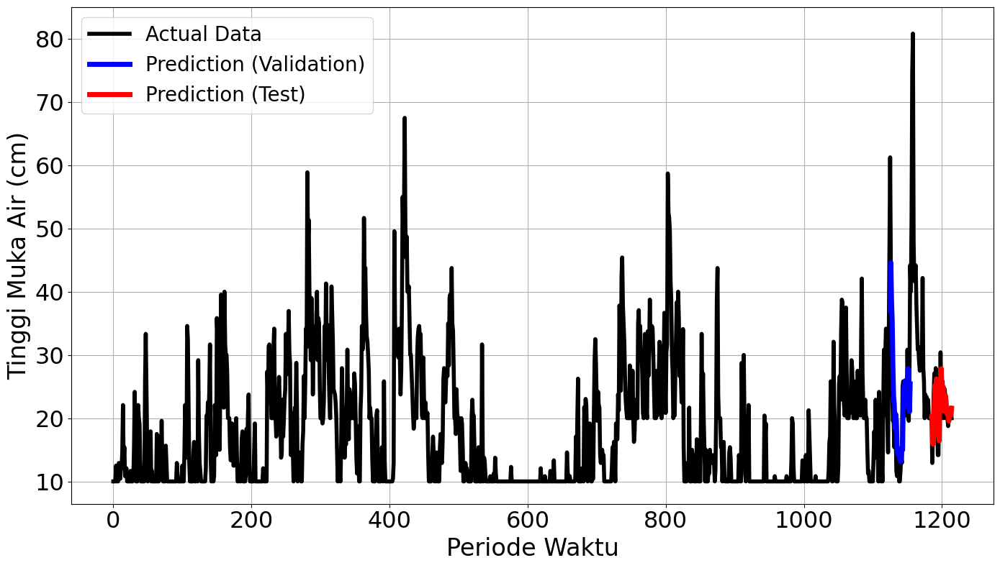

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2854
Final Average MAPE Test: 0.4754
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.2890 - val_loss: 0.0389
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0295 - val_loss: 0.1624
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0359 - val_loss: 0.1567
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0149 - val_loss: 0.1534
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0112 - val_loss: 0.1750
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0107Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0106 - val_loss: 0.2389
Epoch 00006: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 321ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
mape validation = 65.00732820480616 %
mape test = 127.69522318391846 %


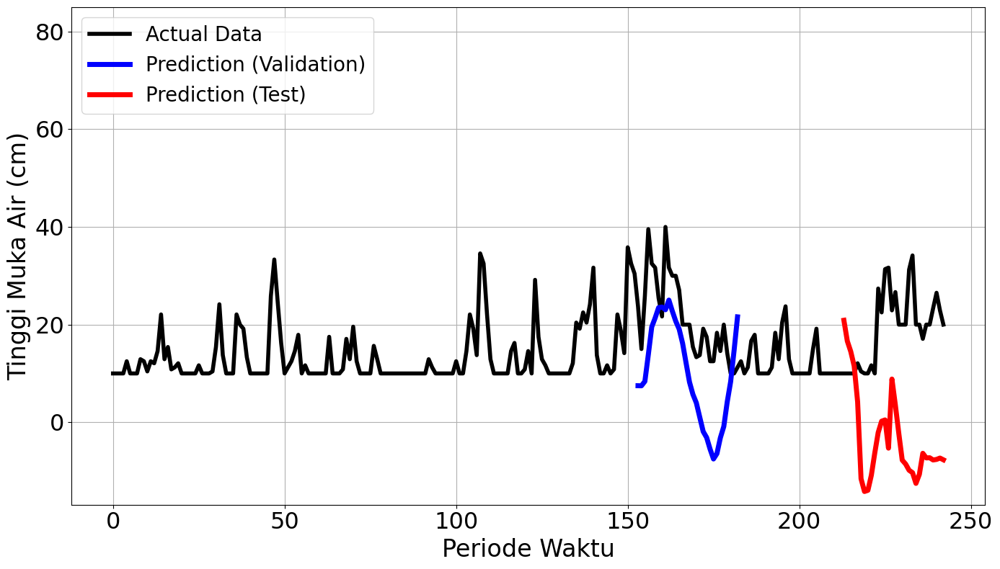

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.1561 - val_loss: 0.0679
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0369 - val_loss: 0.0913
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0184 - val_loss: 0.0616
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0184 - val_loss: 0.0555
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0113 - val_loss: 0.0623
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0117 - val_loss: 0.0650
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0117 - val_loss: 0.0643
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0146 - val_loss: 0.0655
Epoch 9/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0092 - val_loss: 0.0555
Epoch 10/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0105 - val_loss: 0.0501
Epoch 11/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0126 - val_loss: 0.0488
Epoch 12/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0

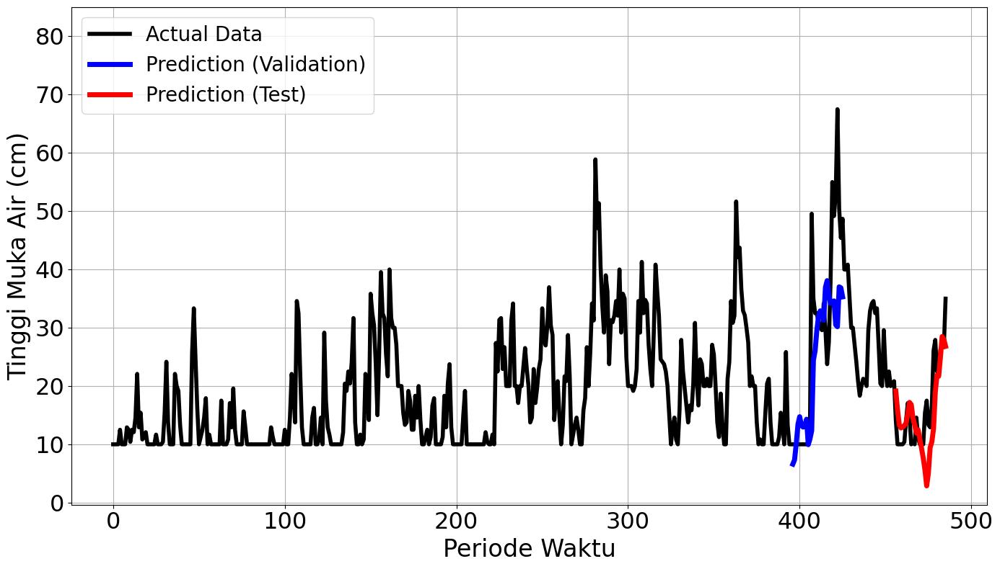

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


37/37 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - loss: 0.1289 - val_loss: 0.0538
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0263 - val_loss: 3.5217e-04
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0116 - val_loss: 5.1108e-04
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0107 - val_loss: 8.1100e-04
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0119 - val_loss: 0.0011
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0092 - val_loss: 0.0029
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0088Restoring model weights from the end of the best epoch.
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0089 - val_loss: 0.0022
Epoch 00007: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 319ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
mape validation = 7.91595530107589 %
mape test = 50.97217262872905 %


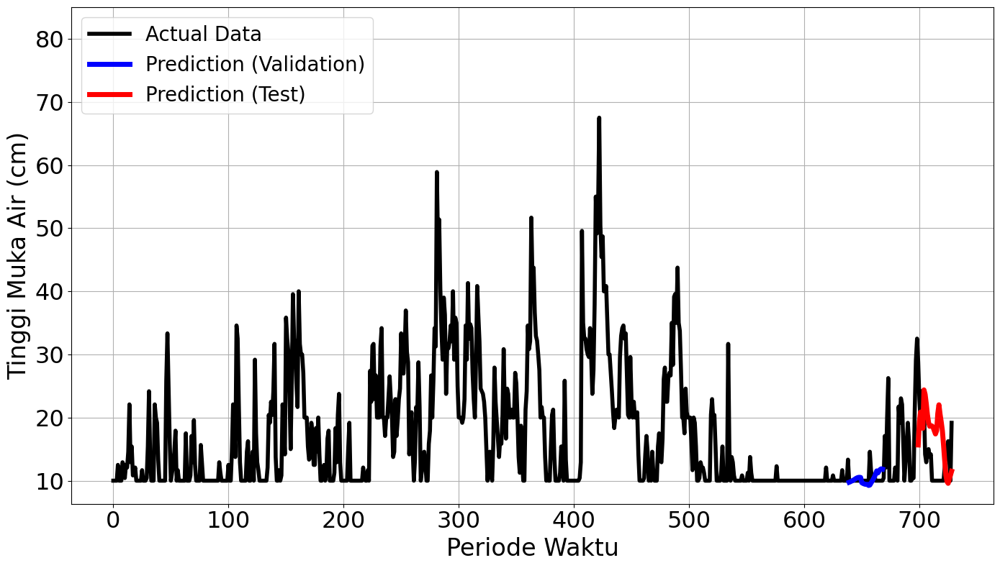

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


52/52 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.1394 - val_loss: 0.0078
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0162 - val_loss: 0.0054
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0106 - val_loss: 0.0066
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0106 - val_loss: 0.0063
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0095 - val_loss: 0.0056
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0086 - val_loss: 0.0049
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0088 - val_loss: 0.0051
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0101 - val_loss: 0.0057
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0088 - val_loss: 0.0033
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0086 - val_loss: 0.0040
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0078 - val_loss: 0.0037
Epoch 12/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0

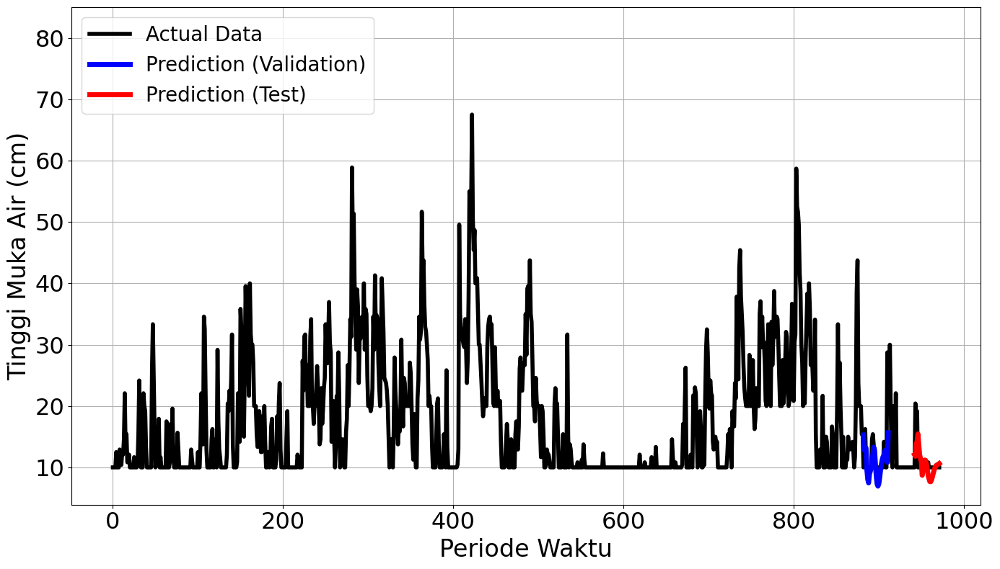

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.1041 - val_loss: 0.0457
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0195 - val_loss: 0.0208
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0097 - val_loss: 0.0190
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0111 - val_loss: 0.0145
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0088 - val_loss: 0.0139
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0105 - val_loss: 0.0129
Epoch 7/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0100 - val_loss: 0.0129
Epoch 8/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0080 - val_loss: 0.0157
Epoch 9/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0088 - val_loss: 0.0116
Epoch 10/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0069 - val_loss: 0.0182
Epoch 11/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0100 - val_loss: 0.0120
Epoch 12/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0

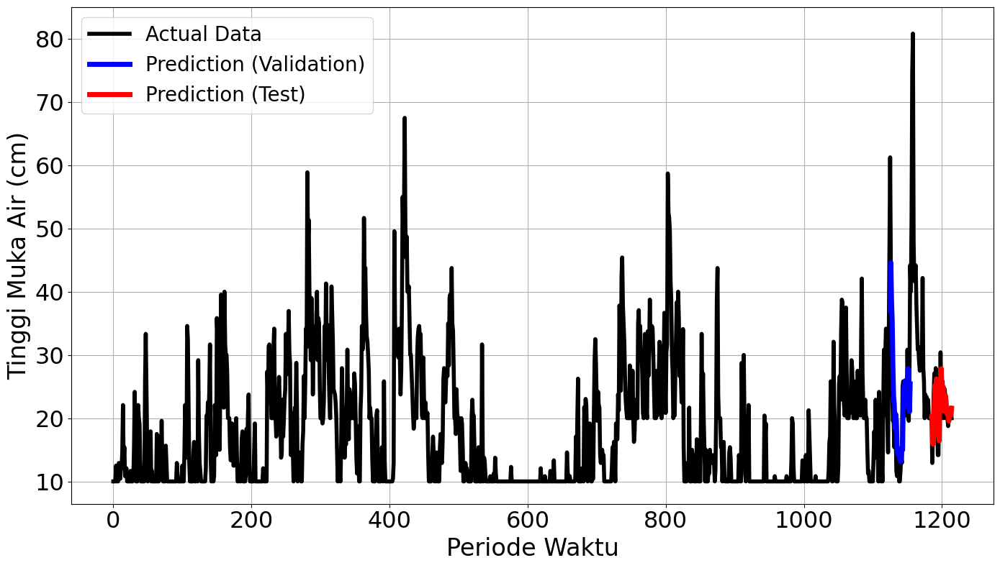

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2854
Final Average MAPE Test: 0.4754
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 518ms/step - loss: 0.6360 - val_loss: 0.1151
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0878 - val_loss: 0.0143
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0339 - val_loss: 0.0409
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0250 - val_loss: 0.1163
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0281 - val_loss: 0.1896
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0276 - val_loss: 0.2311
Epoch 7/100
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0286Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0259 - val_loss: 0.2489
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
mape validation = 40.61003619723774 %
mape test = 86.901713387291 %


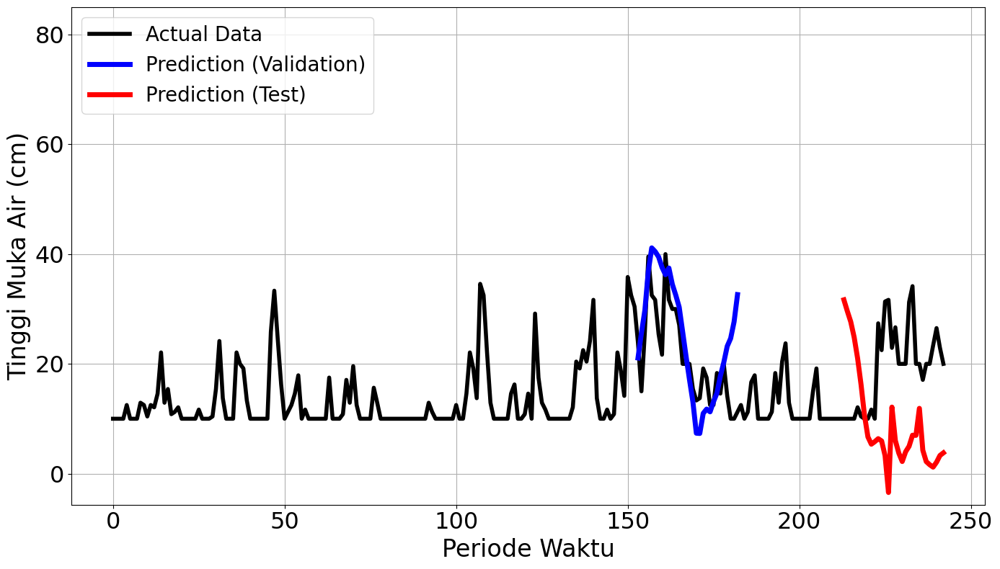

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 138ms/step - loss: 0.2411 - val_loss: 0.1924
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0847 - val_loss: 0.1155
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0411 - val_loss: 0.0698
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0285 - val_loss: 0.0608
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0138 - val_loss: 0.0616
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0209 - val_loss: 0.0509
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0136 - val_loss: 0.0580
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0131 - val_loss: 0.0589
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0159 - val_loss: 0.0500
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0136 - val_loss: 0.0541
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0120 - val_loss: 0.0474
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0110 - val_loss: 0.0431


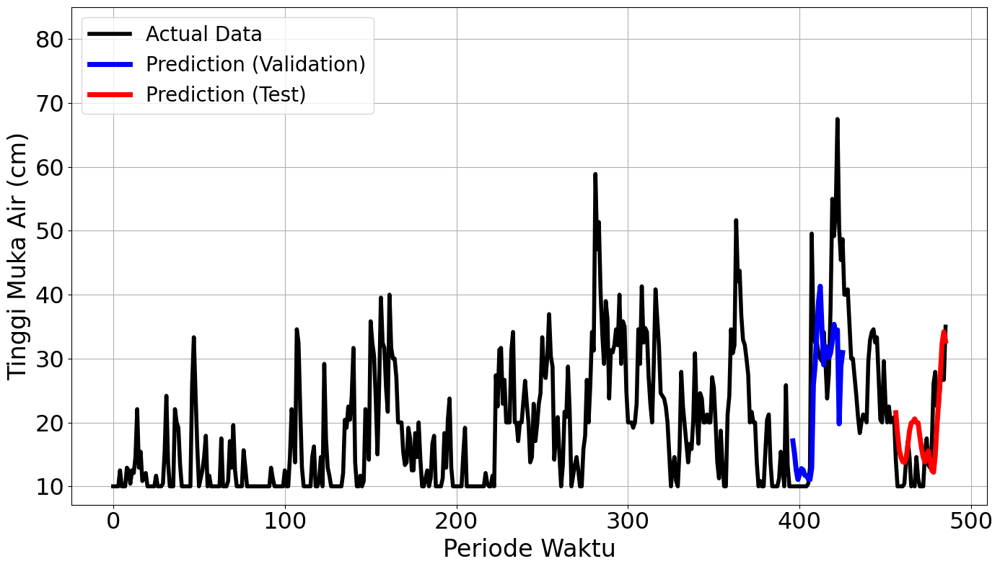

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.2442 - val_loss: 9.2832e-04
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0383 - val_loss: 0.0012
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0275 - val_loss: 0.0045
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0175 - val_loss: 0.0019
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0135 - val_loss: 0.0012
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0123 - val_loss: 7.7981e-04
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0120 - val_loss: 4.8327e-04
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0126 - val_loss: 0.0027
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0107 - val_loss: 0.0018
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0098 - val_loss: 6.9507e-04
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0092 - val_loss: 3.3170e-04
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 5

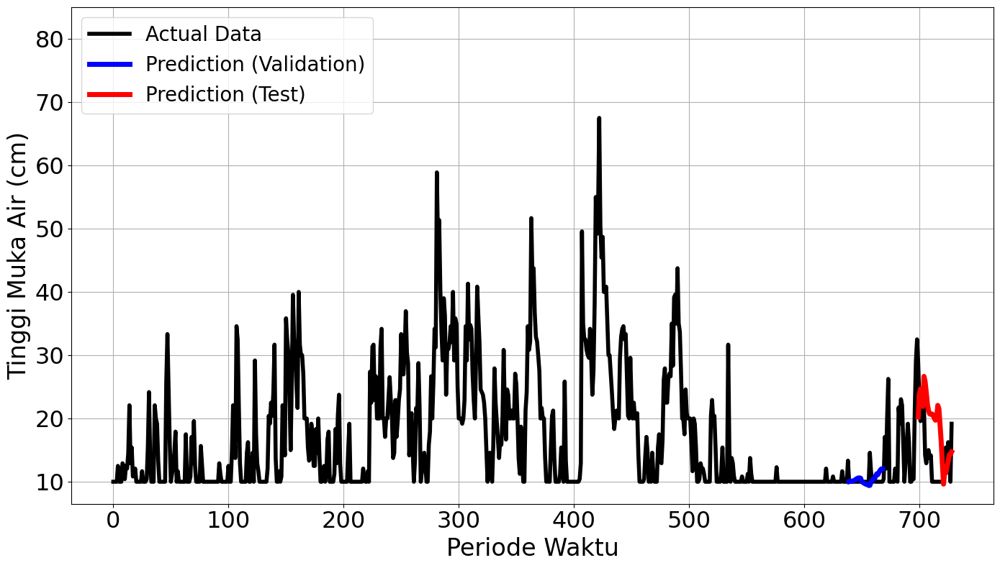

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step - loss: 0.2021 - val_loss: 0.0279
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0332 - val_loss: 0.0246
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0221 - val_loss: 0.0293
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0139 - val_loss: 0.0211
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0132 - val_loss: 0.0133
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0095 - val_loss: 0.0155
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0126 - val_loss: 0.0133
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0104 - val_loss: 0.0115
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0096 - val_loss: 0.0079
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0099 - val_loss: 0.0056
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0075 - val_loss: 0.0104
Epoch 12/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.

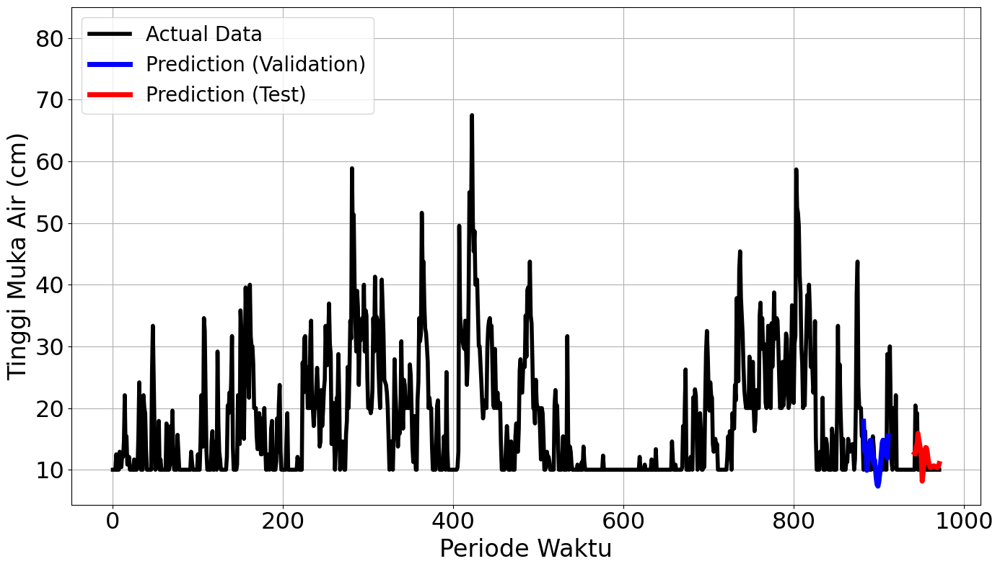

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.1897 - val_loss: 0.0317
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0280 - val_loss: 0.0232
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0127 - val_loss: 0.0204
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0101 - val_loss: 0.0190
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0111 - val_loss: 0.0161
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0097 - val_loss: 0.0153
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.0095 - val_loss: 0.0159
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0080 - val_loss: 0.0156
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0072 - val_loss: 0.0140
Epoch 10/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0088 - val_loss: 0.0144
Epoch 11/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0090 - val_loss: 0.0172
Epoch 12/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.

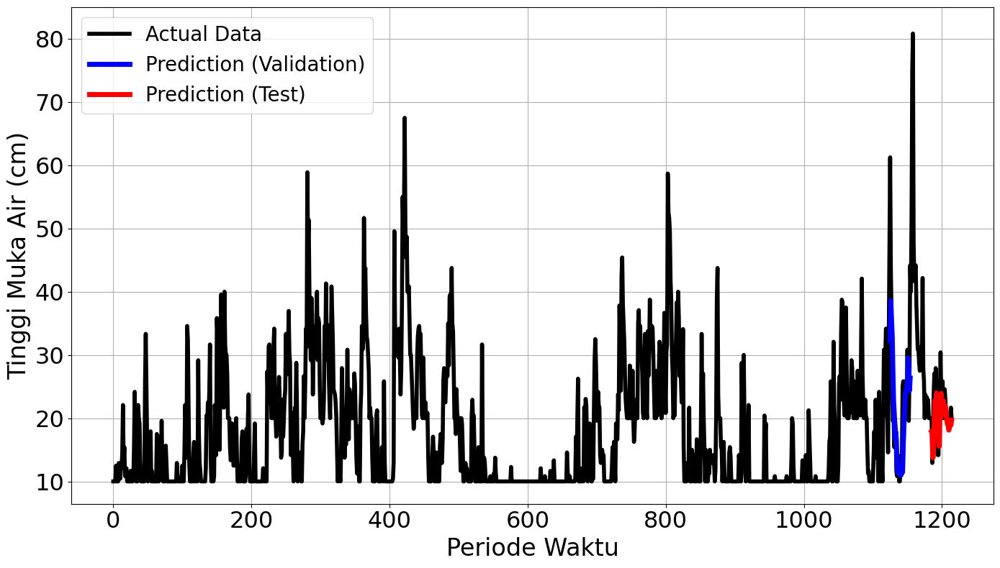

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2459
Final Average MAPE Test: 0.4188
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 556ms/step - loss: 0.6360 - val_loss: 0.1151
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0878 - val_loss: 0.0143
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0339 - val_loss: 0.0409
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0250 - val_loss: 0.1163
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - loss: 0.0281 - val_loss: 0.1896
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0276 - val_loss: 0.2311
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0266 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - loss: 0.0259 - val_loss: 0.2489
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
mape validation = 40.61003619723774 %
mape test = 86.901713387291 %


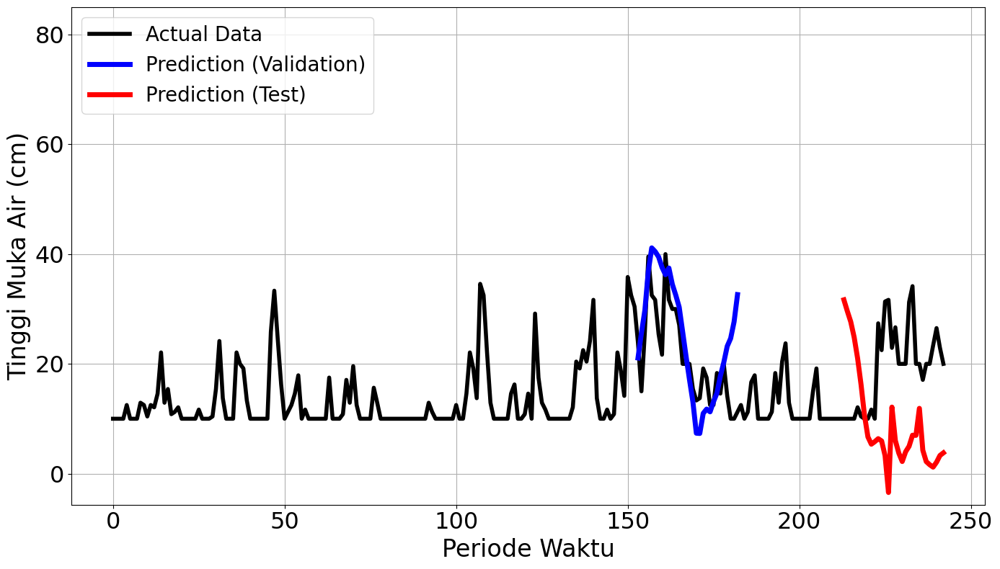

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 0.2411 - val_loss: 0.1924
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0847 - val_loss: 0.1155
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0411 - val_loss: 0.0698
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0285 - val_loss: 0.0608
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0138 - val_loss: 0.0616
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0209 - val_loss: 0.0509
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0136 - val_loss: 0.0580
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0131 - val_loss: 0.0589
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0159 - val_loss: 0.0500
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0136 - val_loss: 0.0541
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0120 - val_loss: 0.0474
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0110 - val_loss: 0.0431


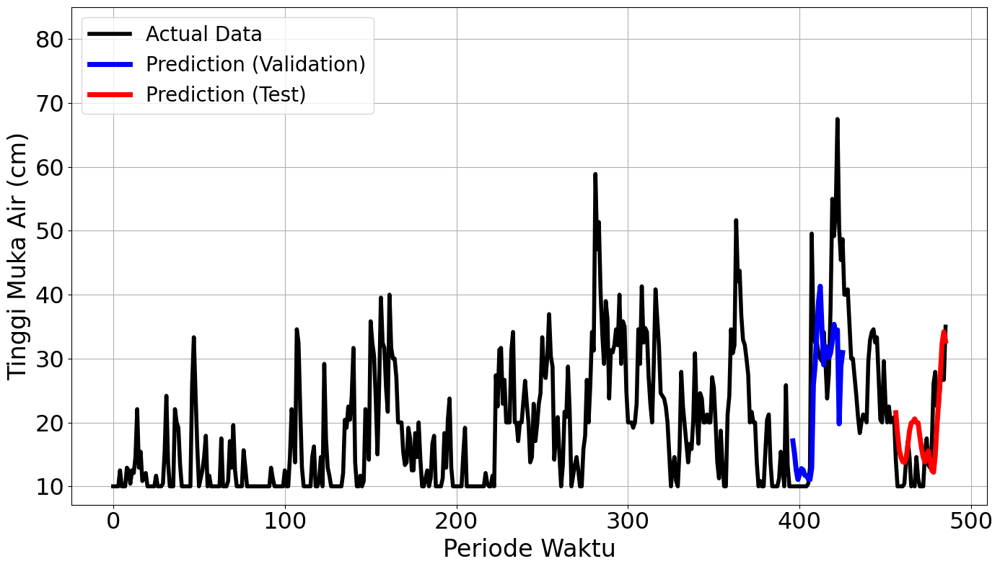

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2442 - val_loss: 9.2832e-04
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0383 - val_loss: 0.0012
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0275 - val_loss: 0.0045
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0175 - val_loss: 0.0019
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0135 - val_loss: 0.0012
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0123 - val_loss: 7.7981e-04
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0120 - val_loss: 4.8327e-04
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0126 - val_loss: 0.0027
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0107 - val_loss: 0.0018
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0098 - val_loss: 6.9507e-04
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0092 - val_loss: 3.3170e-04
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 7

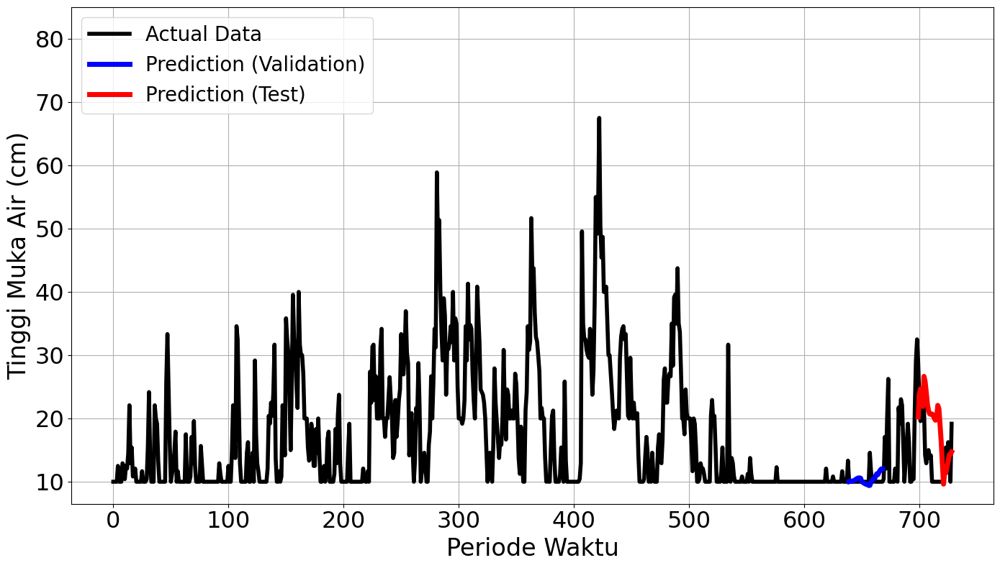

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2021 - val_loss: 0.0279
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0332 - val_loss: 0.0246
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0221 - val_loss: 0.0293
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0139 - val_loss: 0.0211
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0132 - val_loss: 0.0133
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0095 - val_loss: 0.0155
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0126 - val_loss: 0.0133
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0104 - val_loss: 0.0115
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0096 - val_loss: 0.0079
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0099 - val_loss: 0.0056
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0075 - val_loss: 0.0104
Epoch 12/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0

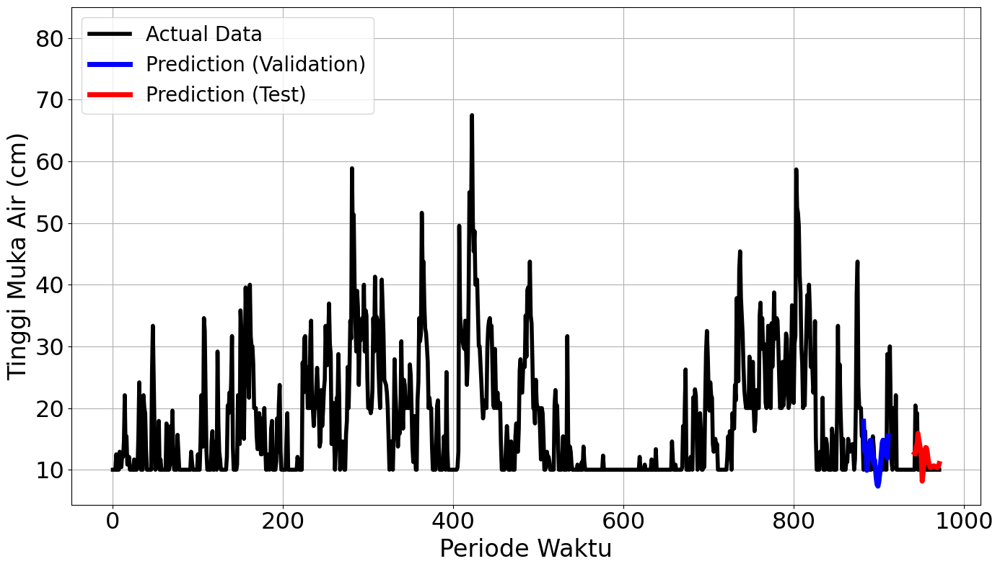

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - loss: 0.1897 - val_loss: 0.0317
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - loss: 0.0280 - val_loss: 0.0232
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0127 - val_loss: 0.0204
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0101 - val_loss: 0.0190
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0111 - val_loss: 0.0161
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0097 - val_loss: 0.0153
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - val_loss: 0.0159
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0080 - val_loss: 0.0156
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0072 - val_loss: 0.0140
Epoch 10/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0088 - val_loss: 0.0144
Epoch 11/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0090 - val_loss: 0.0172
Epoch 12/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0

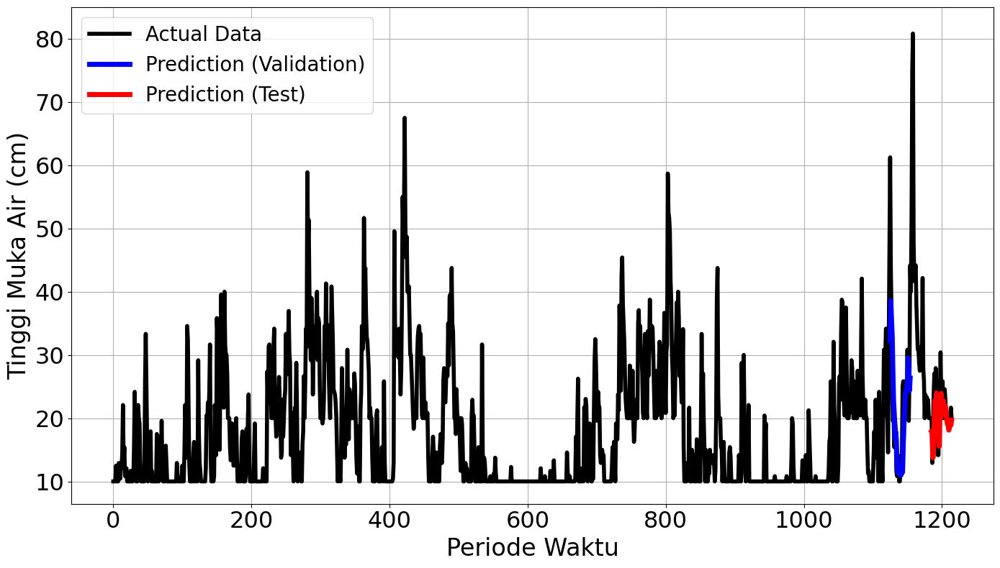

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2459
Final Average MAPE Test: 0.4188
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.5838 - val_loss: 0.1902
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.2446 - val_loss: 0.1256
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0995 - val_loss: 0.0688
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0483 - val_loss: 0.0260
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step - loss: 0.0344 - val_loss: 0.0238
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step - loss: 0.0273 - val_loss: 0.0531
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0227 - val_loss: 0.0872
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - loss: 0.0216 - val_loss: 0.1064
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0217 - val_loss: 0.1107
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0182Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - loss: 0.0182 - val_loss: 0.1094
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

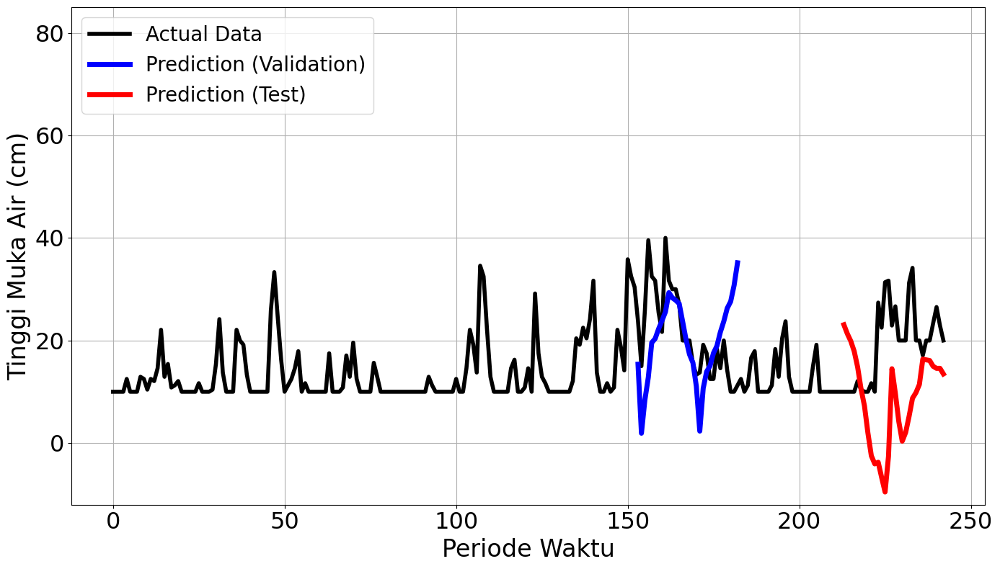

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 527ms/step - loss: 0.3786 - val_loss: 0.3097
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0845 - val_loss: 0.2105
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0704 - val_loss: 0.1171
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0421 - val_loss: 0.0556
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0316 - val_loss: 0.0371
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0273 - val_loss: 0.0377
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0181 - val_loss: 0.0387
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - loss: 0.0170 - val_loss: 0.0353
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0168 - val_loss: 0.0325
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0151 - val_loss: 0.0333
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0167 - val_loss: 0.0371
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0142 - val_loss

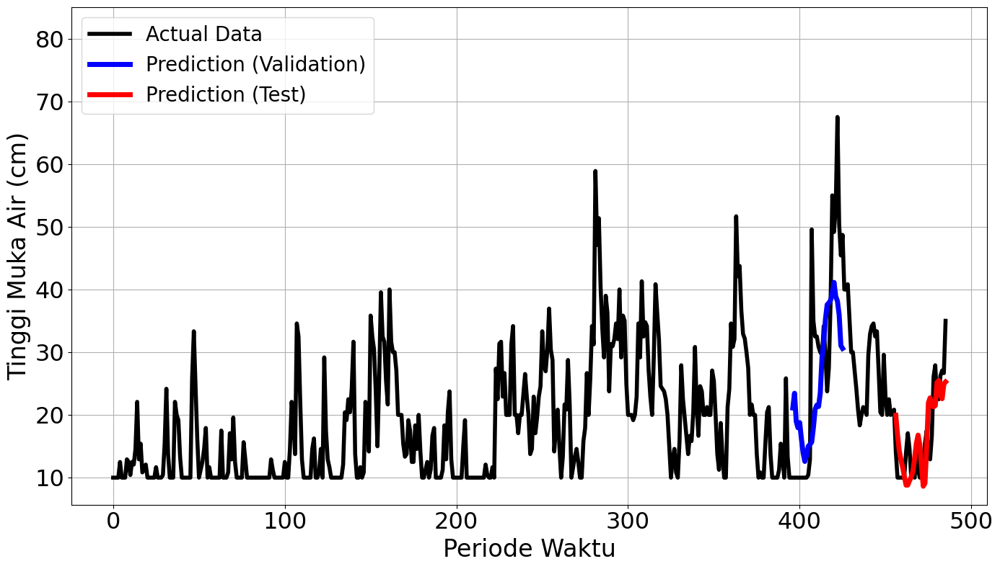

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 290ms/step - loss: 0.2742 - val_loss: 0.0045
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.0740 - val_loss: 0.0020
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0240 - val_loss: 8.0567e-04
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0224 - val_loss: 0.0033
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0215 - val_loss: 0.0016
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0184 - val_loss: 8.5315e-04
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0105 - val_loss: 8.3010e-04
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0099Restoring model weights from the end of the best epoch.
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.0104 - val_loss: 0.0011
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
mape validation = 15.692683093040023 %
mape test = 64.66616511323497 %


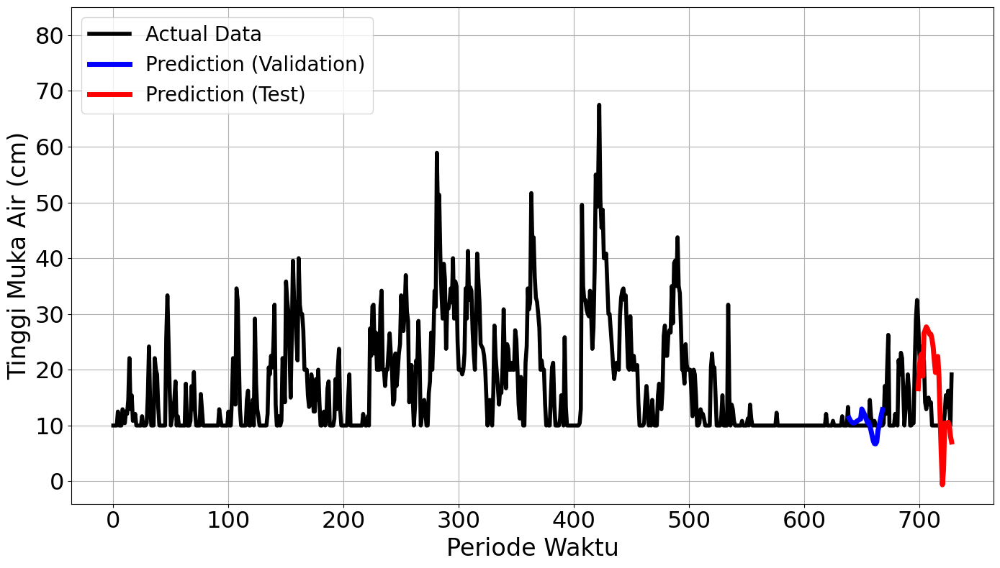

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 208ms/step - loss: 0.2619 - val_loss: 0.0379
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.0316 - val_loss: 0.0327
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0248 - val_loss: 0.0269
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0190 - val_loss: 0.0321
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0162 - val_loss: 0.0293
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0122 - val_loss: 0.0191
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0099 - val_loss: 0.0137
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0109 - val_loss: 0.0150
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0110 - val_loss: 0.0123
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0100 - val_loss: 0.0118
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0080 - val_loss: 0.0122
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0093 - val_loss: 0.0094


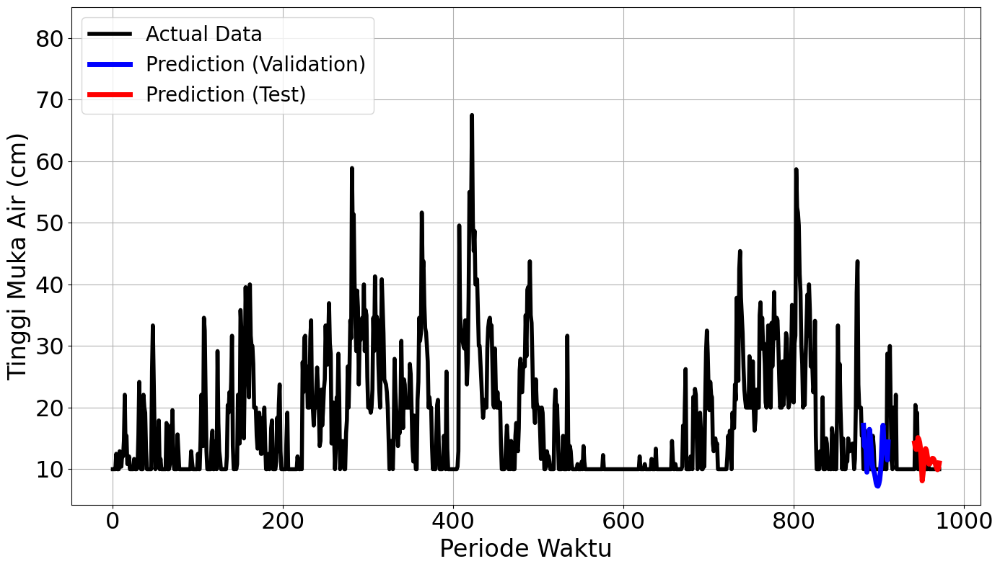

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.2148 - val_loss: 0.0411
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0316 - val_loss: 0.0319
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0249 - val_loss: 0.0177
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0124 - val_loss: 0.0159
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0117 - val_loss: 0.0169
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0115 - val_loss: 0.0193
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0093 - val_loss: 0.0177
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0087 - val_loss: 0.0148
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0098 - val_loss: 0.0163
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0095 - val_loss: 0.0146
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0073 - val_loss: 0.0145
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0095 - val_loss: 0.0151


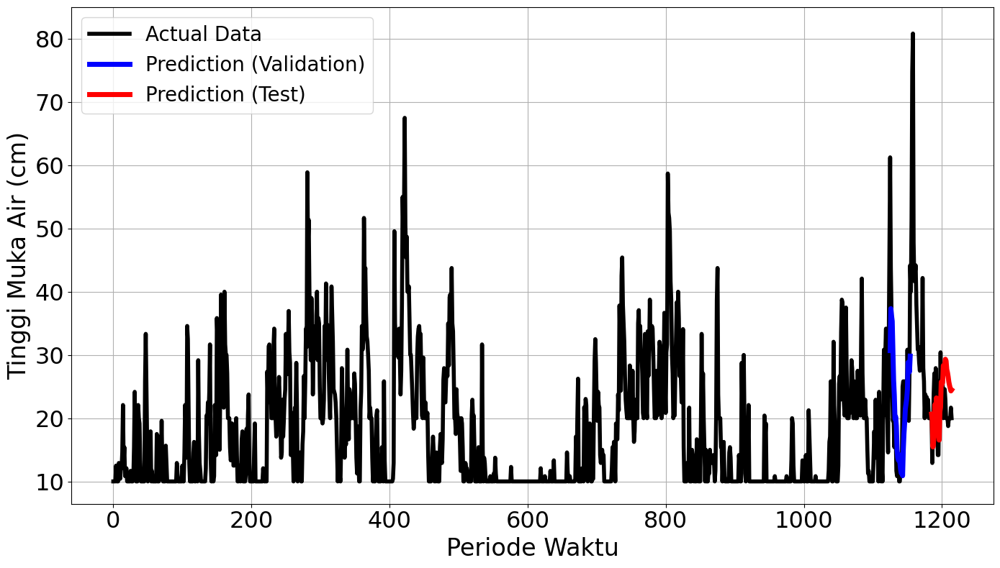

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3208
Final Average MAPE Test: 0.4150
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.5838 - val_loss: 0.1902
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - loss: 0.2446 - val_loss: 0.1256
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - loss: 0.0995 - val_loss: 0.0688
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0483 - val_loss: 0.0260
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0344 - val_loss: 0.0238
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0273 - val_loss: 0.0531
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0227 - val_loss: 0.0872
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0216 - val_loss: 0.1064
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0217 - val_loss: 0.1107
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0182Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.0182 - val_loss: 0.1094
Epoch 00010: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

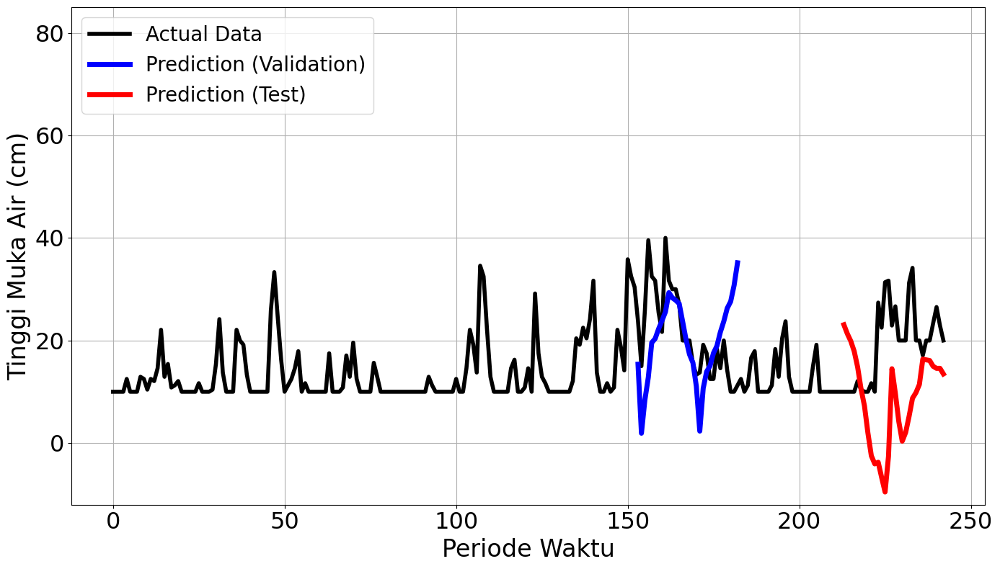

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 324ms/step - loss: 0.3786 - val_loss: 0.3097
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0845 - val_loss: 0.2105
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0704 - val_loss: 0.1171
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0421 - val_loss: 0.0556
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - loss: 0.0316 - val_loss: 0.0371
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 135ms/step - loss: 0.0273 - val_loss: 0.0377
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.0181 - val_loss: 0.0387
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0170 - val_loss: 0.0353
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0168 - val_loss: 0.0325
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0151 - val_loss: 0.0333
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0167 - val_loss: 0.0371
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0142 - val_loss

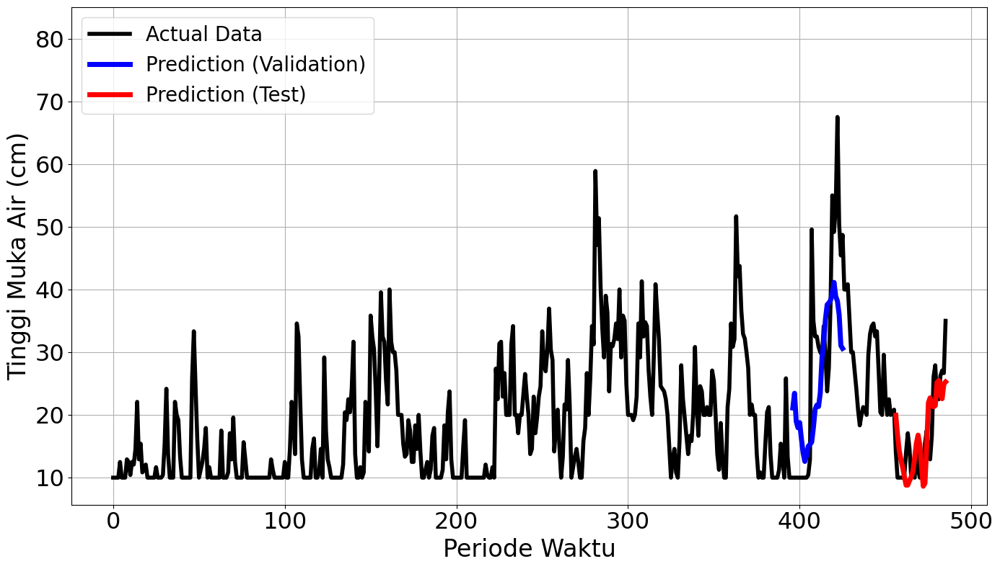

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 198ms/step - loss: 0.2742 - val_loss: 0.0045
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0740 - val_loss: 0.0020
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0240 - val_loss: 8.0567e-04
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0224 - val_loss: 0.0033
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0215 - val_loss: 0.0016
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0184 - val_loss: 8.5315e-04
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.0105 - val_loss: 8.3010e-04
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0099Restoring model weights from the end of the best epoch.
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0104 - val_loss: 0.0011
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
mape validation = 15.692683093040023 %
mape test = 64.66616511323497 %


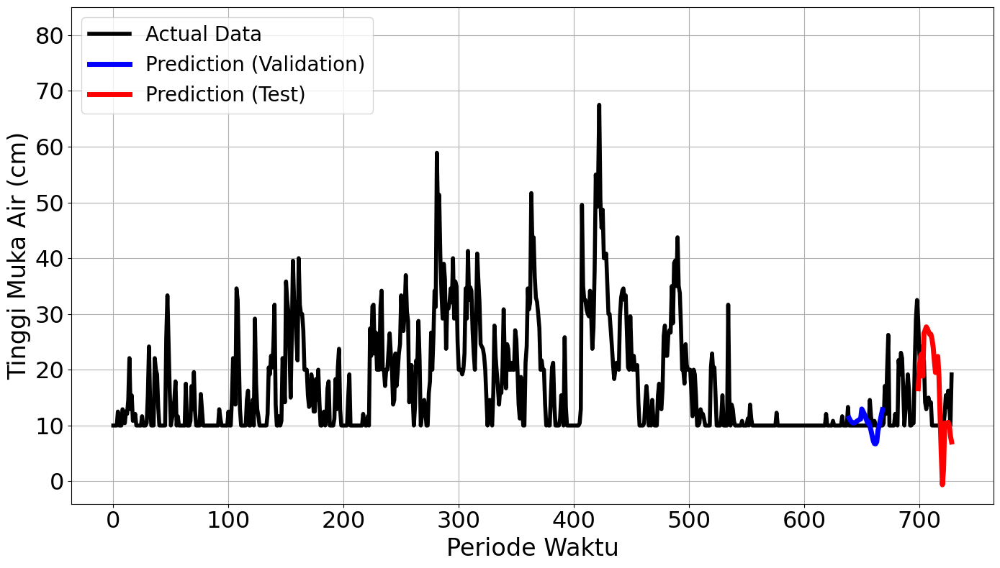

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.2619 - val_loss: 0.0379
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0316 - val_loss: 0.0327
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0248 - val_loss: 0.0269
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0190 - val_loss: 0.0321
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.0162 - val_loss: 0.0293
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0122 - val_loss: 0.0191
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0099 - val_loss: 0.0137
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0109 - val_loss: 0.0150
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0110 - val_loss: 0.0123
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0100 - val_loss: 0.0118
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0080 - val_loss: 0.0122
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0093 - val_loss: 0.0094


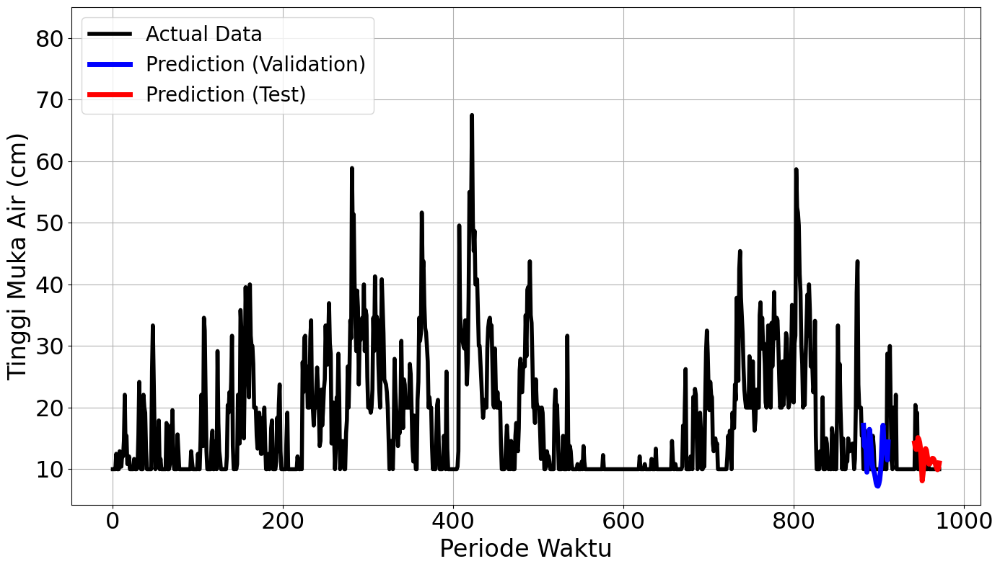

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 171ms/step - loss: 0.2148 - val_loss: 0.0411
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0316 - val_loss: 0.0319
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0249 - val_loss: 0.0177
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0124 - val_loss: 0.0159
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0117 - val_loss: 0.0169
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0115 - val_loss: 0.0193
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0093 - val_loss: 0.0177
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0087 - val_loss: 0.0148
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0098 - val_loss: 0.0163
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0095 - val_loss: 0.0146
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0073 - val_loss: 0.0145
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.0095 - val_loss: 0.0151

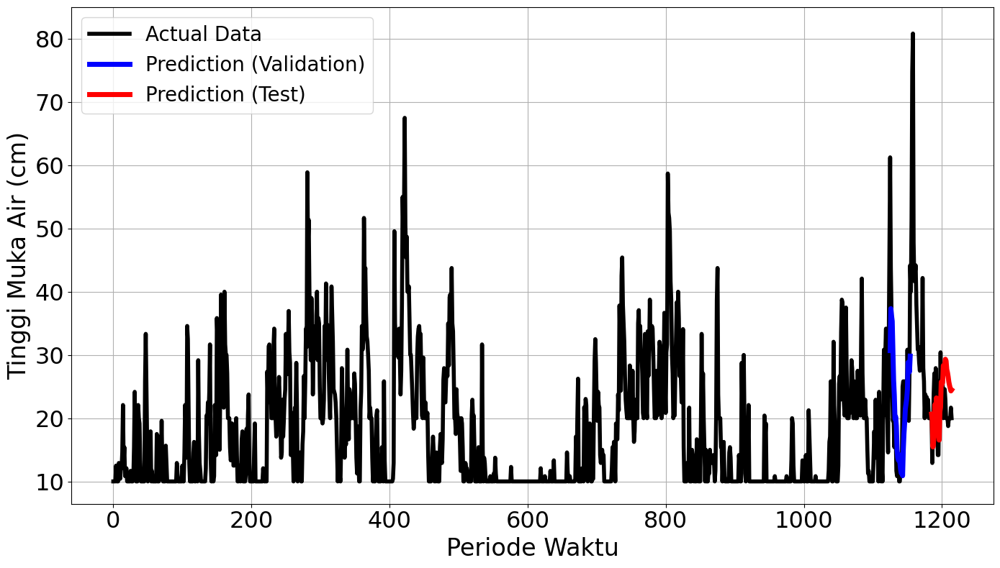

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3208
Final Average MAPE Test: 0.4150
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.0430 - val_loss: 0.0124
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0089 - val_loss: 0.0958
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0070 - val_loss: 0.0158
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0097 - val_loss: 0.0330
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.0067 - val_loss: 0.0225
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0074Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0074 - val_loss: 0.0299
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
mape validation = 32.728181428928785 %
mape test = 35.46699699823455 %


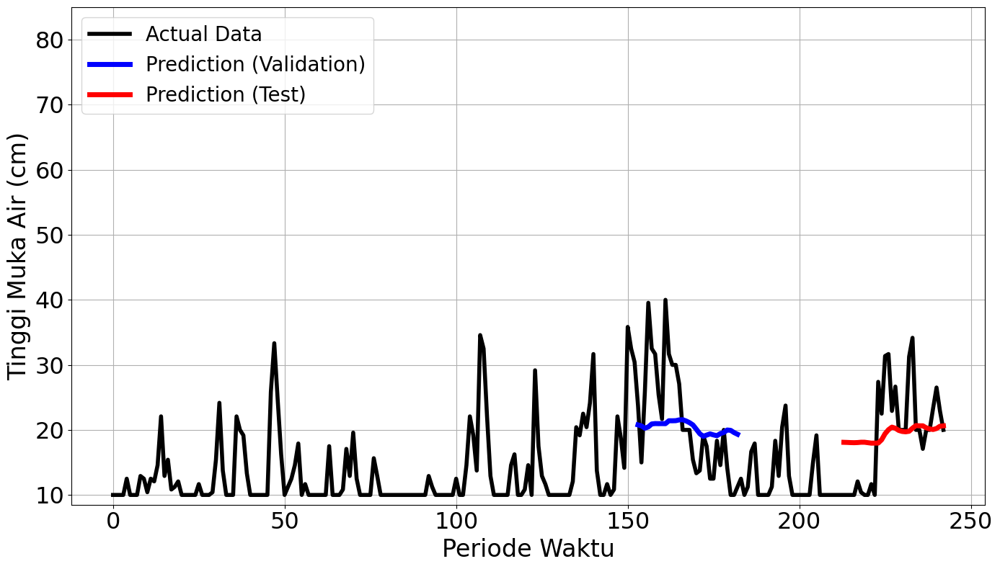

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0389 - val_loss: 0.0300
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.0113 - val_loss: 0.0180
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0101 - val_loss: 0.0177
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.0087 - val_loss: 0.0202
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0084 - val_loss: 0.0307
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.0085 - val_loss: 0.0312
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.0085 - val_loss: 0.0303
Epoch 8/100
335/336 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0065Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.0065 - val_loss: 0.0305
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
mape validation = 21.40926469590708 %
mape test = 31.21253985335747 %


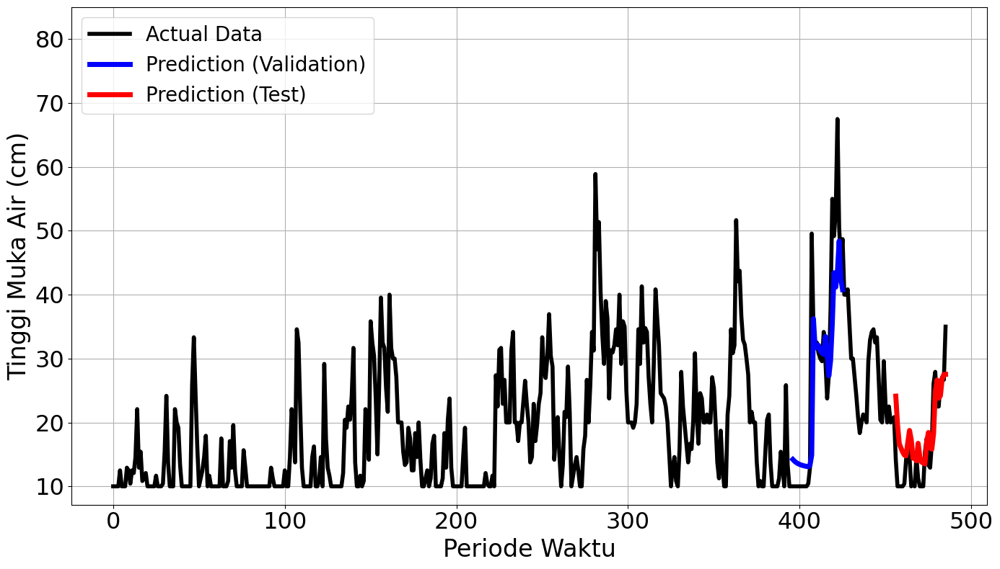

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.0514 - val_loss: 0.0051
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0081 - val_loss: 0.0158
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0083 - val_loss: 0.0028
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0074 - val_loss: 0.0024
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0076 - val_loss: 2.3523e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0072 - val_loss: 0.0011
Epoch 7/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0074 - val_loss: 0.0030
Epoch 8/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0082 - val_loss: 0.0052
Epoch 9/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0066 - val_loss: 0.0075
Epoch 10/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0076 - val_loss: 1.9045e-04
Epoch 11/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0061 - val_loss: 0.0019
Epoch 12/100
579/579 ━━

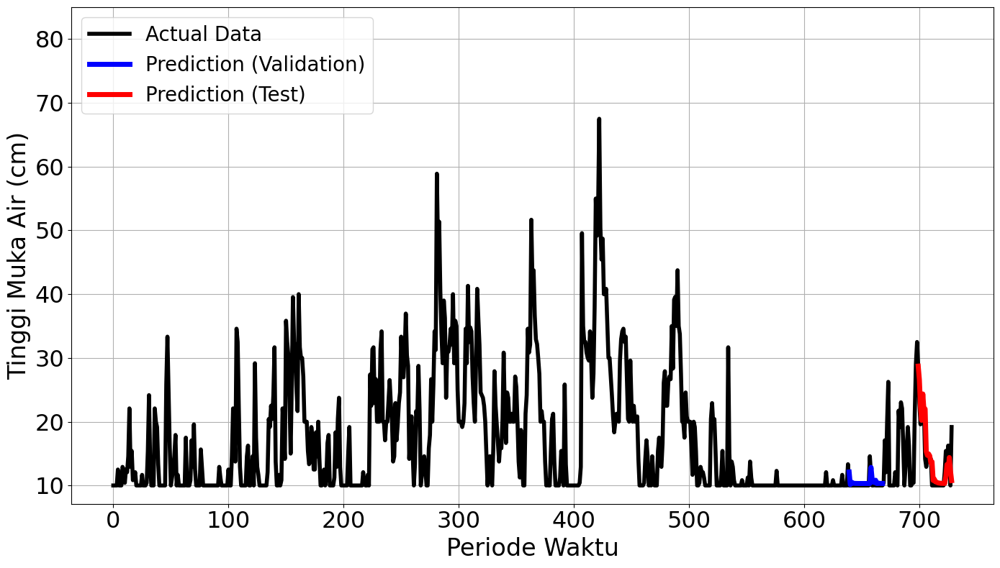

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0319 - val_loss: 0.0047
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0069 - val_loss: 0.0085
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.0074 - val_loss: 0.0092
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0062 - val_loss: 0.0027
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0089 - val_loss: 0.0033
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0076 - val_loss: 0.0092
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.0075 - val_loss: 0.0042
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.0074 - val_loss: 0.0056
Epoch 9/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0062Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0062 - val_loss: 0.0032
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7m

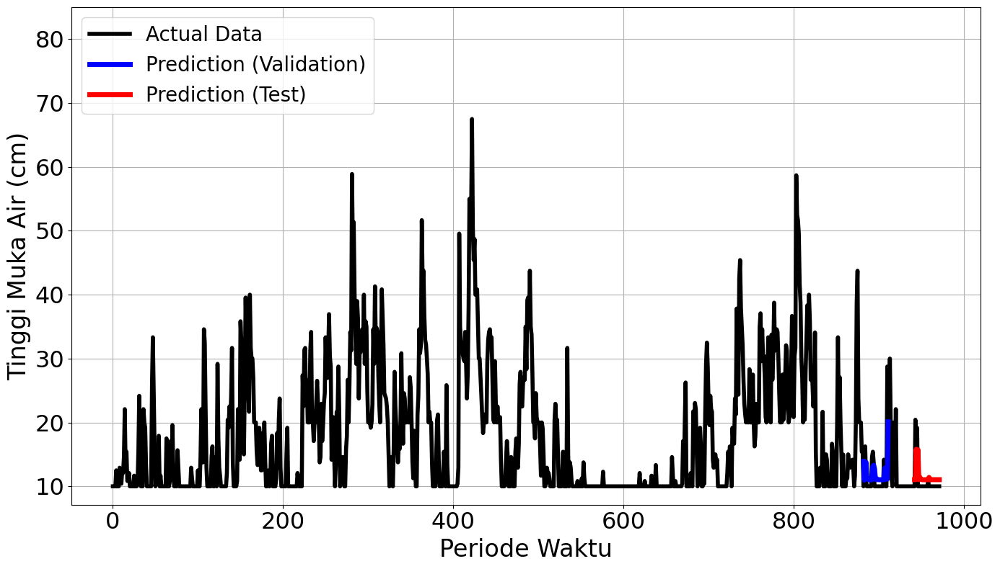

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.0312 - val_loss: 0.0125
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.0077 - val_loss: 0.0104
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0065 - val_loss: 0.0092
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.0068 - val_loss: 0.0088
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.0062 - val_loss: 0.0133
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.0074 - val_loss: 0.0134
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0068 - val_loss: 0.0189
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.0066 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0054Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0054 - val_loss: 0.0098
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
30/30 ━━━━━━

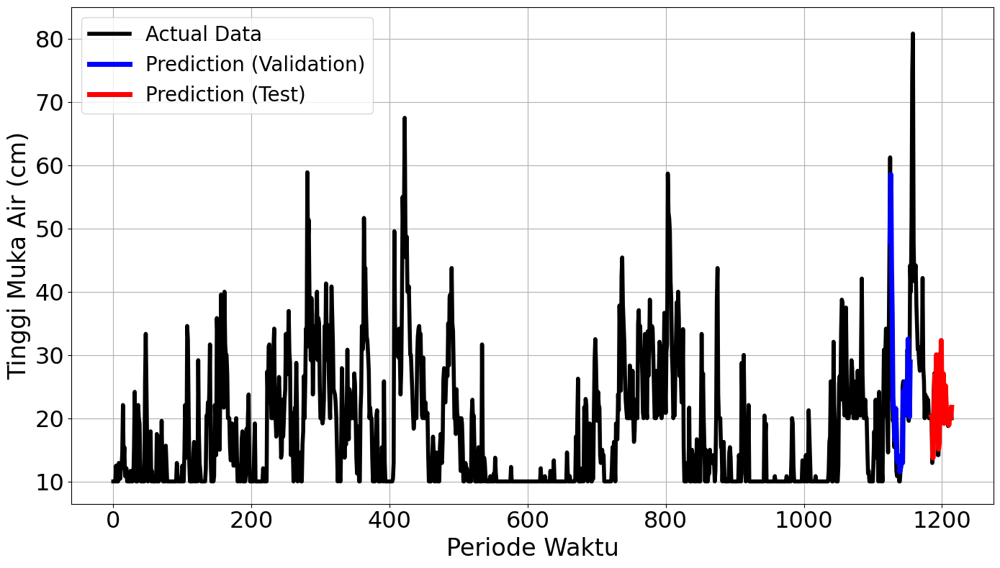

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1919
Final Average MAPE Test: 0.2203
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.0430 - val_loss: 0.0124
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0089 - val_loss: 0.0958
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0070 - val_loss: 0.0158
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0097 - val_loss: 0.0330
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0067 - val_loss: 0.0225
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0074Restoring model weights from the end of the best epoch.
93/93 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0074 - val_loss: 0.0299
Epoch 00006: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
mape validation = 32.728181428928785 %
mape test = 35.46699699823455 %


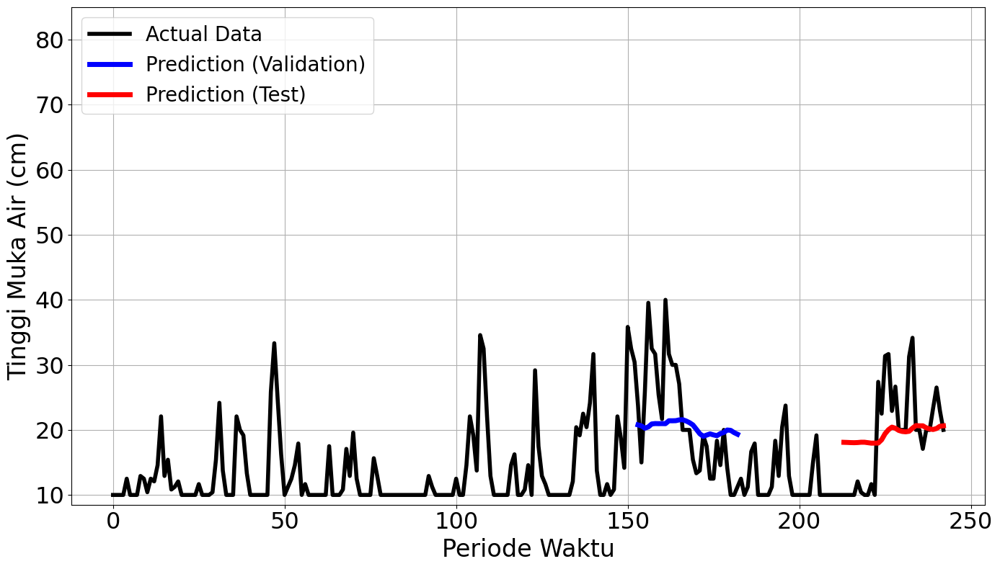

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


336/336 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.0389 - val_loss: 0.0300
Epoch 2/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0113 - val_loss: 0.0180
Epoch 3/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.0101 - val_loss: 0.0177
Epoch 4/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0087 - val_loss: 0.0202
Epoch 5/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.0084 - val_loss: 0.0307
Epoch 6/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.0085 - val_loss: 0.0312
Epoch 7/100
336/336 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.0085 - val_loss: 0.0303
Epoch 8/100
335/336 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0065Restoring model weights from the end of the best epoch.
336/336 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0065 - val_loss: 0.0305
Epoch 00008: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
mape validation = 21.40926469590708 %
mape test = 31.21253985335747 %


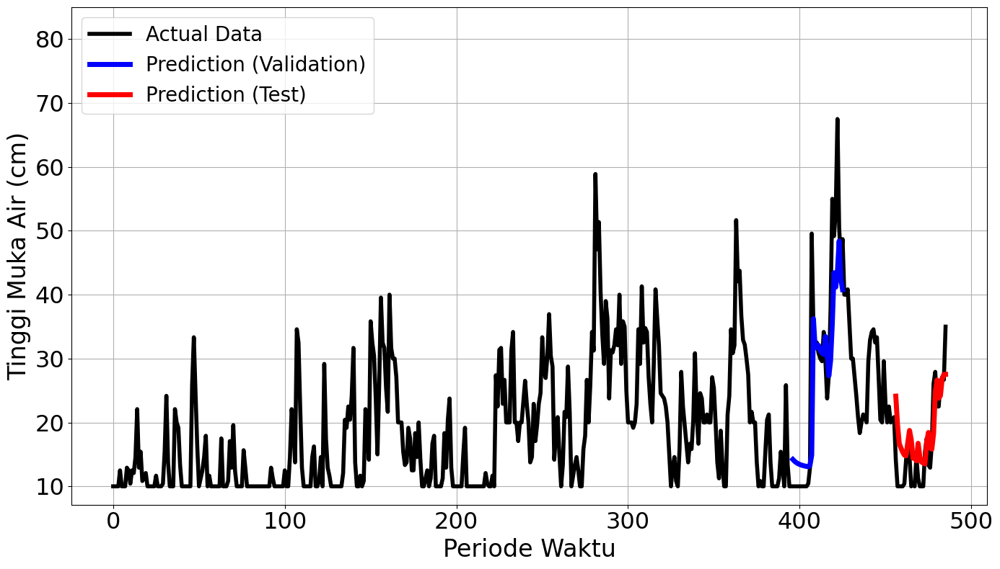

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


579/579 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.0514 - val_loss: 0.0051
Epoch 2/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.0081 - val_loss: 0.0158
Epoch 3/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0083 - val_loss: 0.0028
Epoch 4/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.0074 - val_loss: 0.0024
Epoch 5/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0076 - val_loss: 2.3523e-04
Epoch 6/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0072 - val_loss: 0.0011
Epoch 7/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.0074 - val_loss: 0.0030
Epoch 8/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0082 - val_loss: 0.0052
Epoch 9/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0066 - val_loss: 0.0075
Epoch 10/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.0076 - val_loss: 1.9045e-04
Epoch 11/100
579/579 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.0061 - val_loss: 0.0019
Epoch 12/100
579/579 ━━

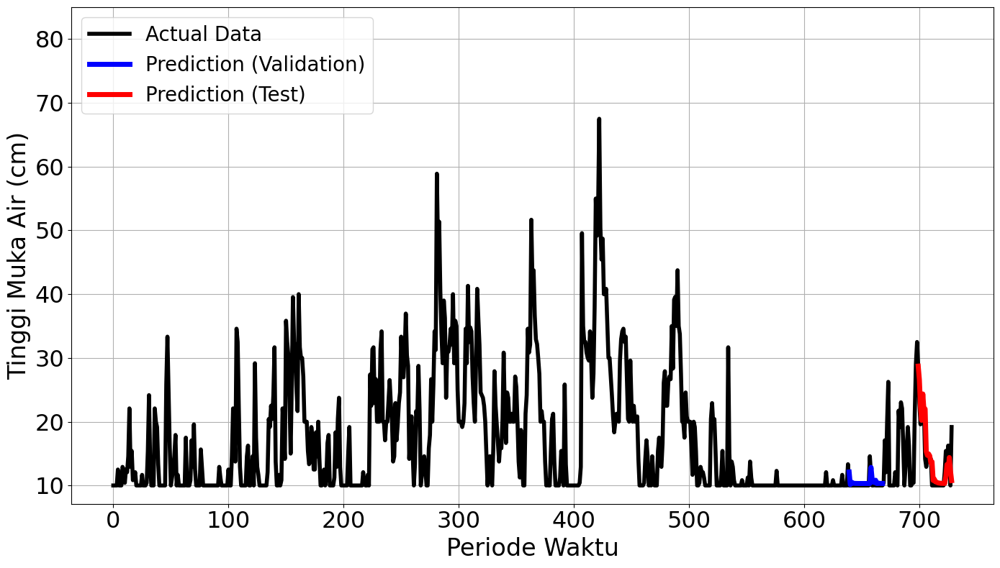

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


822/822 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.0319 - val_loss: 0.0047
Epoch 2/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0069 - val_loss: 0.0085
Epoch 3/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0074 - val_loss: 0.0092
Epoch 4/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0062 - val_loss: 0.0027
Epoch 5/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.0089 - val_loss: 0.0033
Epoch 6/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.0076 - val_loss: 0.0092
Epoch 7/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.0075 - val_loss: 0.0042
Epoch 8/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0074 - val_loss: 0.0056
Epoch 9/100
822/822 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0062Restoring model weights from the end of the best epoch.
822/822 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0062 - val_loss: 0.0032
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7m

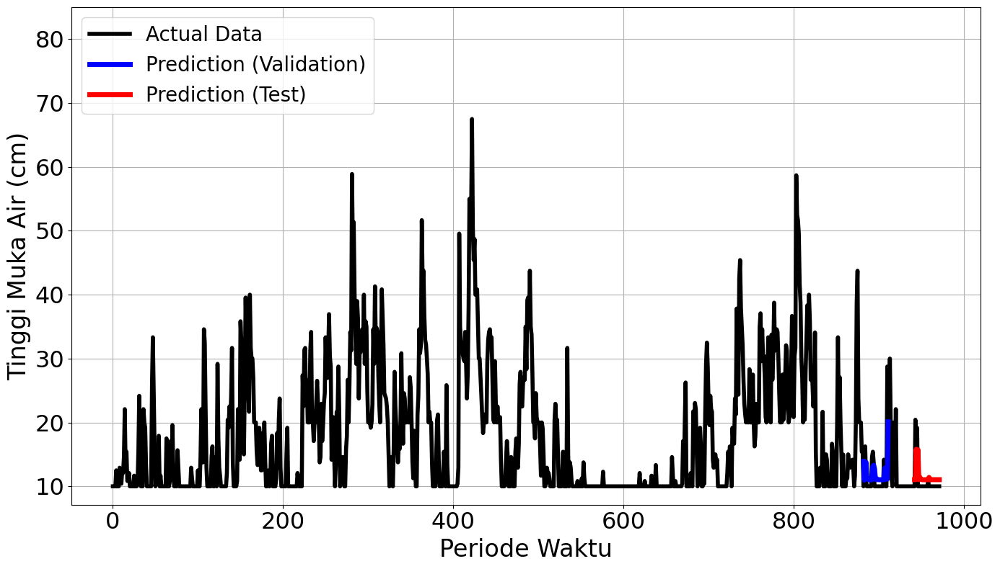

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1065/1065 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.0312 - val_loss: 0.0125
Epoch 2/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.0077 - val_loss: 0.0104
Epoch 3/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.0065 - val_loss: 0.0092
Epoch 4/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.0068 - val_loss: 0.0088
Epoch 5/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.0062 - val_loss: 0.0133
Epoch 6/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0074 - val_loss: 0.0134
Epoch 7/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.0068 - val_loss: 0.0189
Epoch 8/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0066 - val_loss: 0.0093
Epoch 9/100
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0054Restoring model weights from the end of the best epoch.
1065/1065 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0054 - val_loss: 0.0098
Epoch 00009: early stopping
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
30/30 ━━━━━━

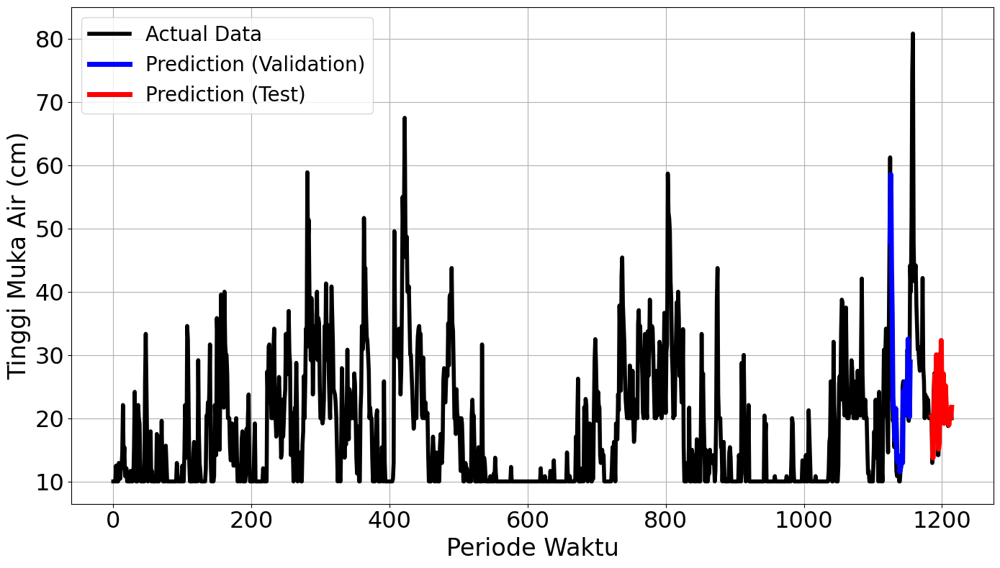

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1919
Final Average MAPE Test: 0.2203
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - loss: 0.2333 - val_loss: 0.0139
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0316 - val_loss: 0.0153
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0279 - val_loss: 0.1169
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0188 - val_loss: 0.0474
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0097 - val_loss: 0.0190
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0067Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0068 - val_loss: 0.0214
Epoch 00006: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 436ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
mape validation = 37.00783870371482 %
mape test = 64.92942772168011 %


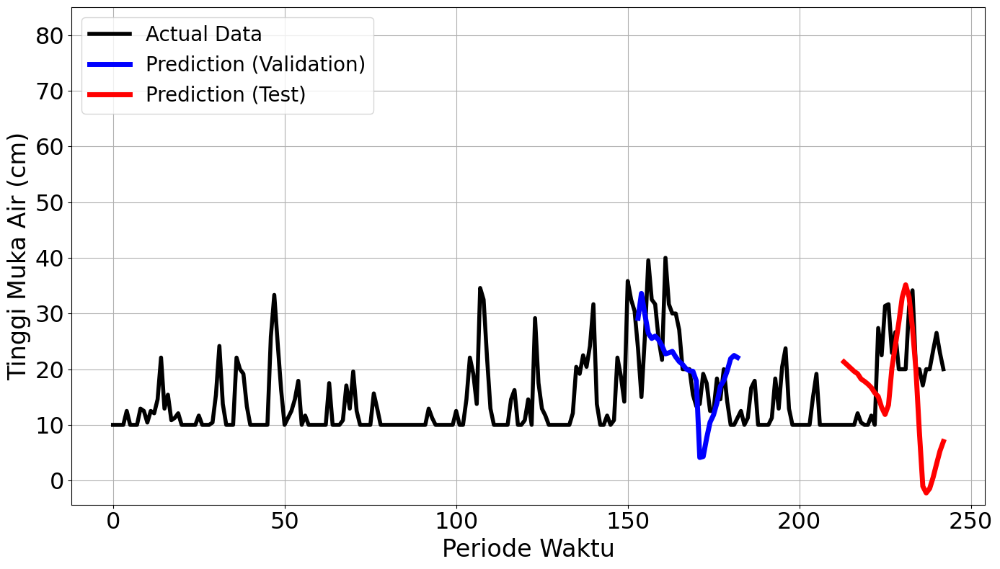

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1168 - val_loss: 0.0456
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0293 - val_loss: 0.0490
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0183 - val_loss: 0.0258
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0194 - val_loss: 0.0301
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0111 - val_loss: 0.0193
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0097 - val_loss: 0.0178
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0136 - val_loss: 0.0297
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0146 - val_loss: 0.0235
Epoch 9/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - val_loss: 0.0219
Epoch 10/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0108 - val_loss: 0.0210
Epoch 11/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0095Restoring model weights from the end of the best epoch.
21/21 ━━━━━━━━━━━━━━━━━━━━ 1

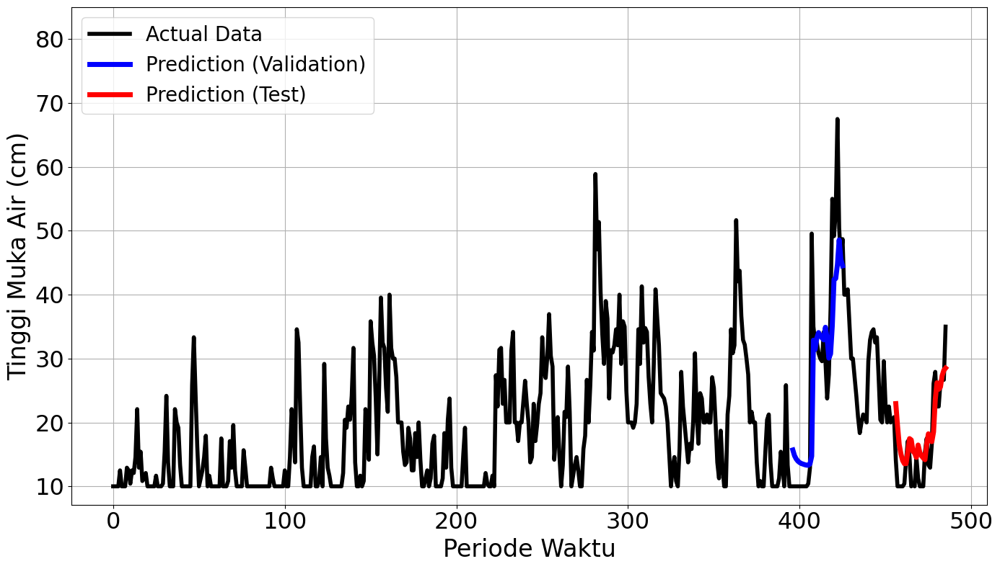

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - loss: 0.1013 - val_loss: 0.0171
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0163 - val_loss: 3.2546e-04
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0082 - val_loss: 2.3436e-04
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0076 - val_loss: 4.1217e-04
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0091 - val_loss: 4.9439e-04
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0076 - val_loss: 9.1187e-04
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - val_loss: 0.0043
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0092 - val_loss: 1.9782e-04
Epoch 9/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - val_loss: 0.0019
Epoch 10/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0074 - val_loss: 0.0021
Epoch 11/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - val_loss: 0.0012
Epoch 12/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 

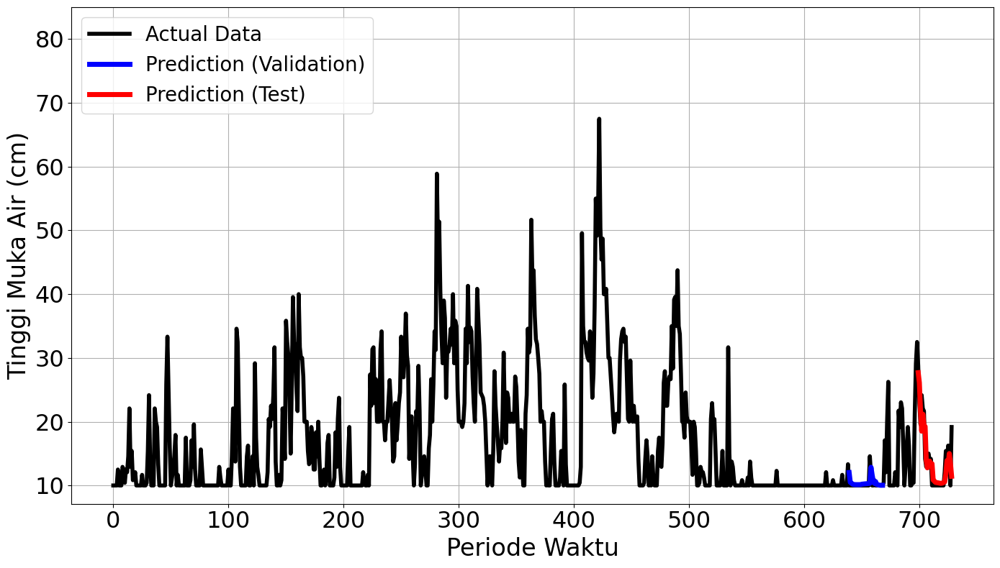

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


52/52 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - loss: 0.1587 - val_loss: 0.0127
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0111 - val_loss: 0.0061
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0081 - val_loss: 0.0044
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0075 - val_loss: 0.0034
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0078 - val_loss: 0.0038
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0065 - val_loss: 0.0033
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0071 - val_loss: 0.0037
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0081 - val_loss: 0.0050
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0072 - val_loss: 0.0036
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0077 - val_loss: 0.0032
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0068 - val_loss: 0.0032
Epoch 12/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0

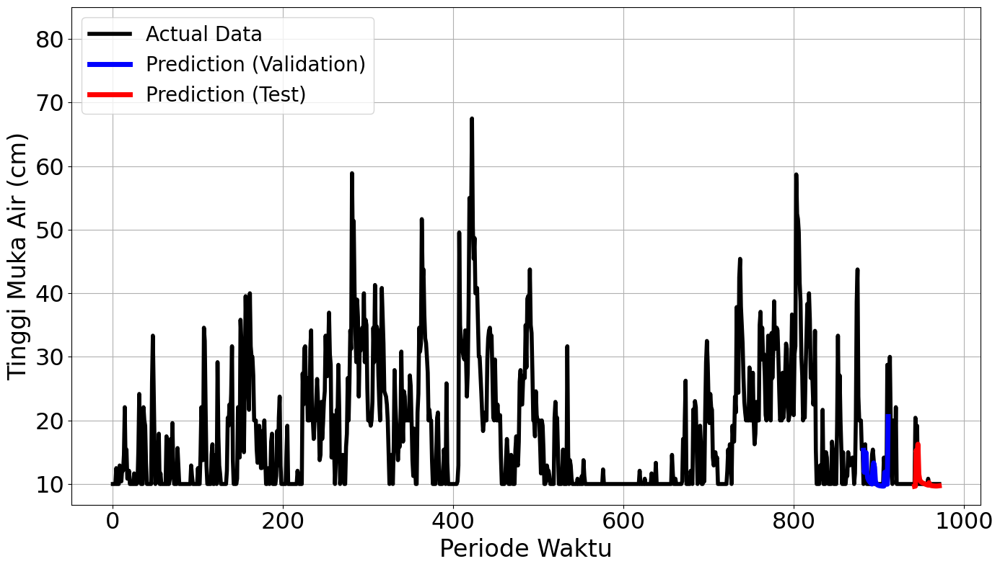

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


67/67 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.1009 - val_loss: 0.0183
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0122 - val_loss: 0.0126
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0074 - val_loss: 0.0122
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0072 - val_loss: 0.0110
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0071 - val_loss: 0.0113
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0082 - val_loss: 0.0108
Epoch 7/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0073 - val_loss: 0.0106
Epoch 8/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0072 - val_loss: 0.0114
Epoch 9/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0071 - val_loss: 0.0110
Epoch 10/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0057 - val_loss: 0.0161
Epoch 11/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0078 - val_loss: 0.0101
Epoch 12/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0

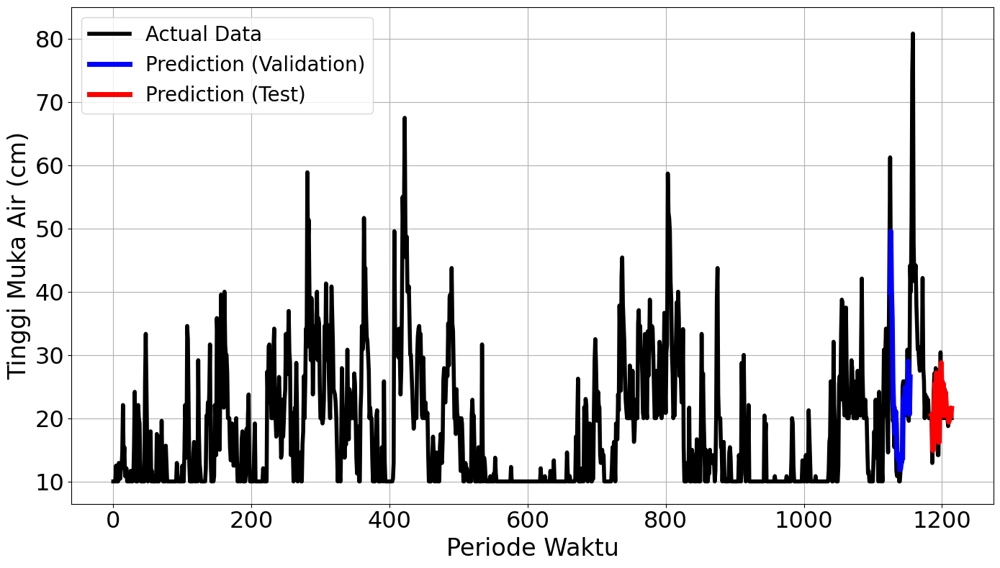

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1996
Final Average MAPE Test: 0.2636
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 184ms/step - loss: 0.2333 - val_loss: 0.0139
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0316 - val_loss: 0.0153
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0279 - val_loss: 0.1169
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0188 - val_loss: 0.0474
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0097 - val_loss: 0.0190
Epoch 6/100
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0066Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0068 - val_loss: 0.0214
Epoch 00006: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 432ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
mape validation = 37.00783870371482 %
mape test = 64.92942772168011 %


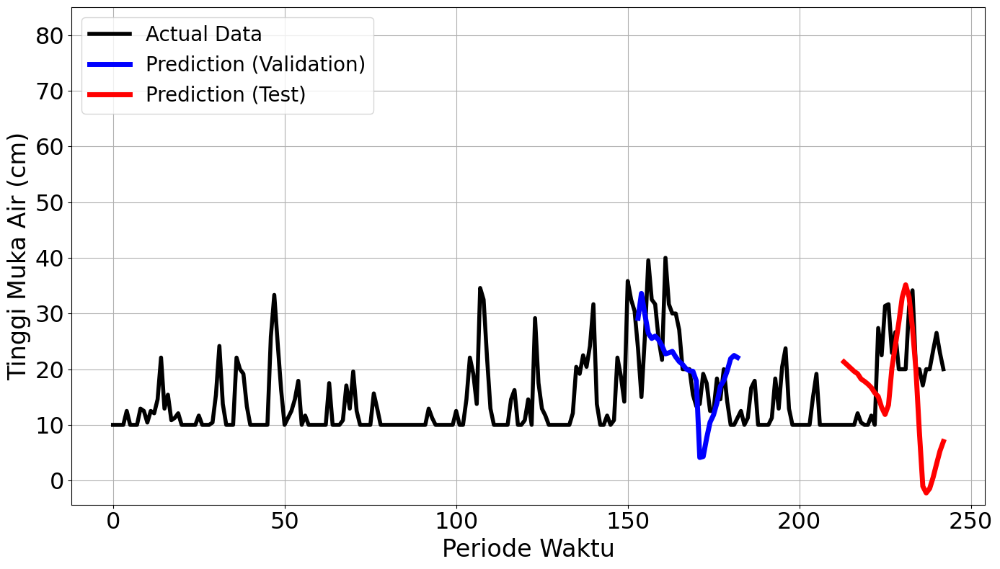

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.1168 - val_loss: 0.0456
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0293 - val_loss: 0.0490
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0183 - val_loss: 0.0258
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0194 - val_loss: 0.0301
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0111 - val_loss: 0.0193
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0097 - val_loss: 0.0178
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0136 - val_loss: 0.0297
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0146 - val_loss: 0.0235
Epoch 9/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0087 - val_loss: 0.0219
Epoch 10/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0108 - val_loss: 0.0210
Epoch 11/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0095Restoring model weights from the end of the best epoch.
21/21 ━━━━━━━━━━━━━━━━━━━━ 1

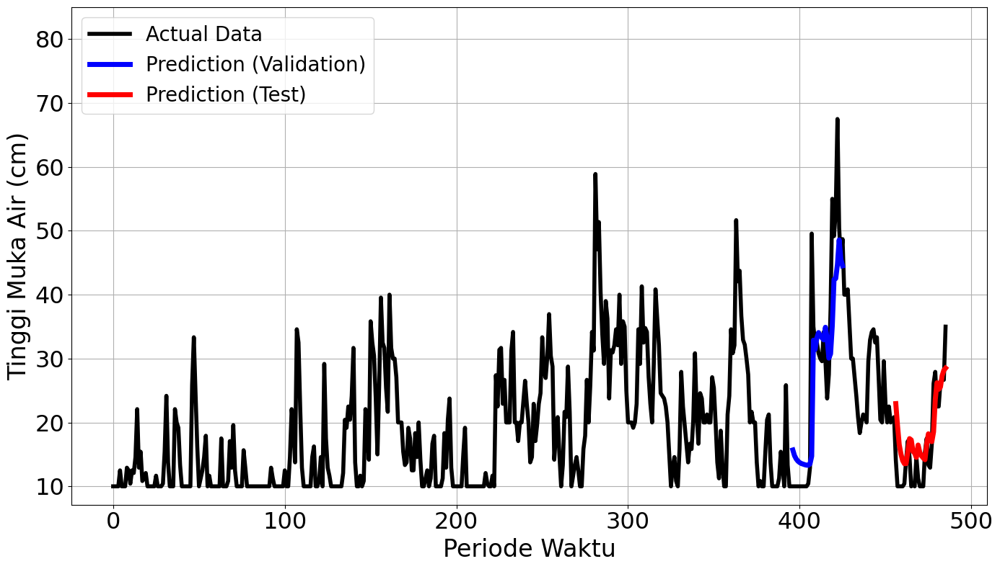

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - loss: 0.1013 - val_loss: 0.0171
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0163 - val_loss: 3.2546e-04
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - val_loss: 2.3436e-04
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - val_loss: 4.1217e-04
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0091 - val_loss: 4.9439e-04
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0076 - val_loss: 9.1187e-04
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0085 - val_loss: 0.0043
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0092 - val_loss: 1.9782e-04
Epoch 9/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0068 - val_loss: 0.0019
Epoch 10/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0074 - val_loss: 0.0021
Epoch 11/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0064 - val_loss: 0.0012
Epoch 12/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 

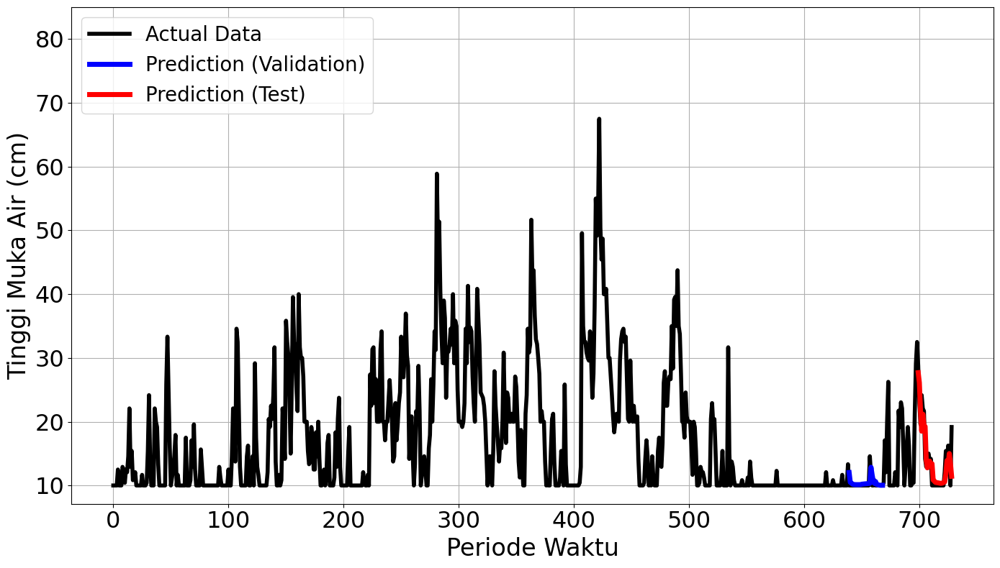

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


52/52 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - loss: 0.1587 - val_loss: 0.0127
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0111 - val_loss: 0.0061
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0081 - val_loss: 0.0044
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0075 - val_loss: 0.0034
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0078 - val_loss: 0.0038
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0065 - val_loss: 0.0033
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0071 - val_loss: 0.0037
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0081 - val_loss: 0.0050
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0072 - val_loss: 0.0036
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0077 - val_loss: 0.0032
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0068 - val_loss: 0.0032
Epoch 12/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0

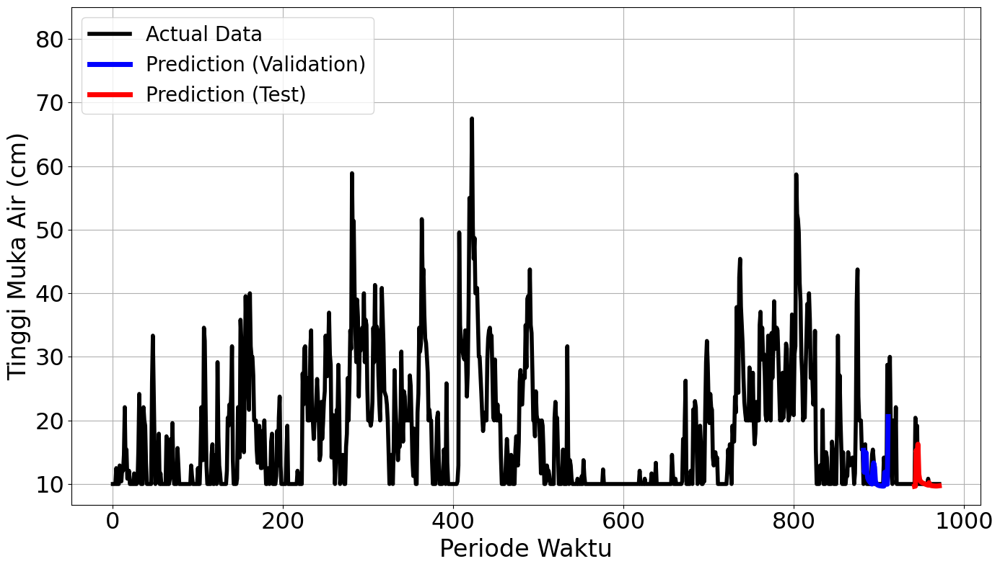

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


67/67 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 0.1009 - val_loss: 0.0183
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0122 - val_loss: 0.0126
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0074 - val_loss: 0.0122
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0072 - val_loss: 0.0110
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0071 - val_loss: 0.0113
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0082 - val_loss: 0.0108
Epoch 7/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0073 - val_loss: 0.0106
Epoch 8/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0072 - val_loss: 0.0114
Epoch 9/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0071 - val_loss: 0.0110
Epoch 10/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0057 - val_loss: 0.0161
Epoch 11/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0078 - val_loss: 0.0101
Epoch 12/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0

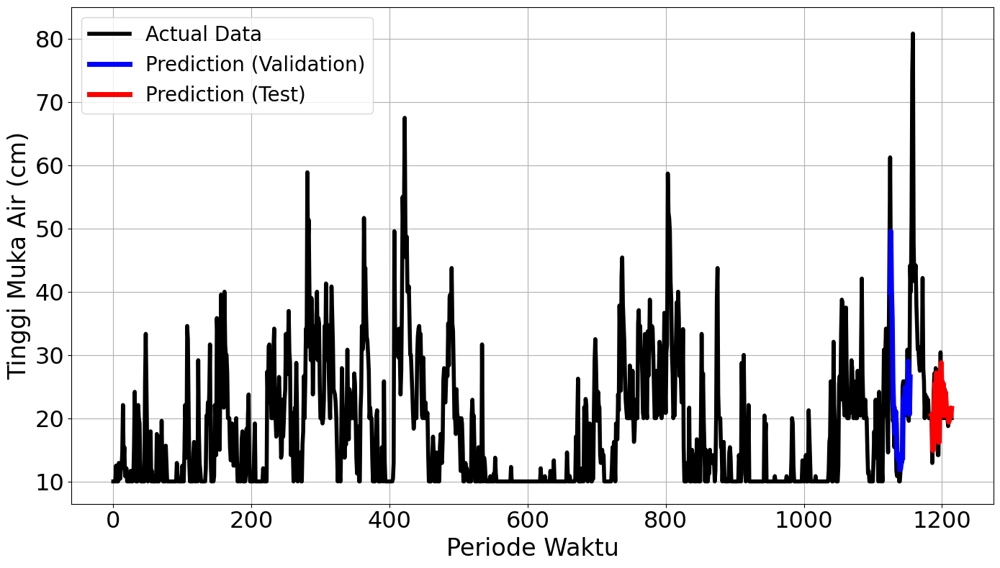

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1996
Final Average MAPE Test: 0.2636
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 796ms/step - loss: 0.6135 - val_loss: 0.1057
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0527 - val_loss: 0.4912
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0756 - val_loss: 0.0940
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0350 - val_loss: 0.0308
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0398 - val_loss: 0.0756
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0107 - val_loss: 0.1755
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0264 - val_loss: 0.1309
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0156 - val_loss: 0.0467
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0188Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0210 - val_loss: 0.0380
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
mape validation = 55.2044491152026

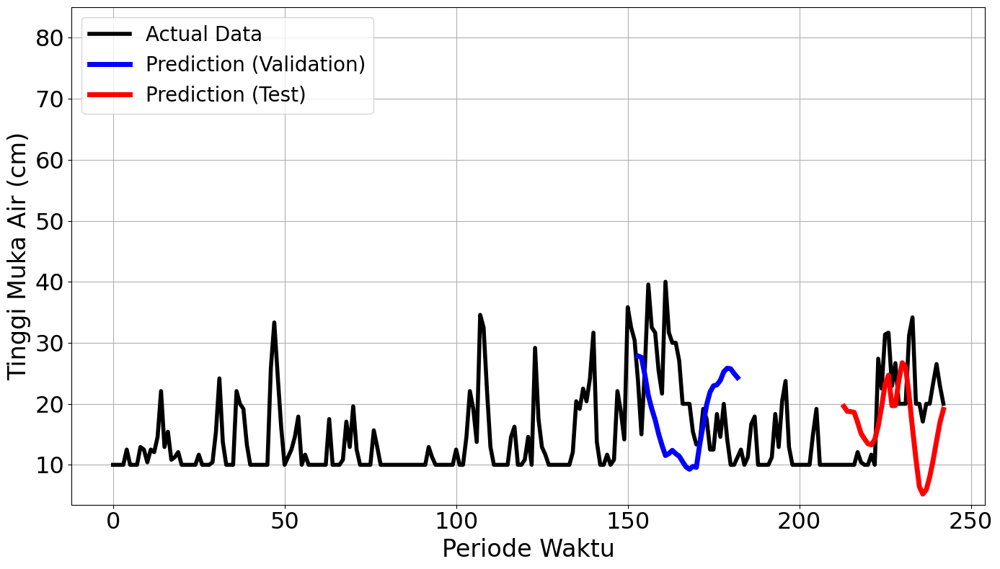

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 232ms/step - loss: 0.1629 - val_loss: 0.0668
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0552 - val_loss: 0.0645
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0279 - val_loss: 0.0769
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0198 - val_loss: 0.0442
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0142 - val_loss: 0.0435
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0173 - val_loss: 0.0390
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0134 - val_loss: 0.0314
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0116 - val_loss: 0.0461
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0115 - val_loss: 0.0405
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0105 - val_loss: 0.0358
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0094 - val_loss: 0.0290
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0094 - val_loss: 0.0366


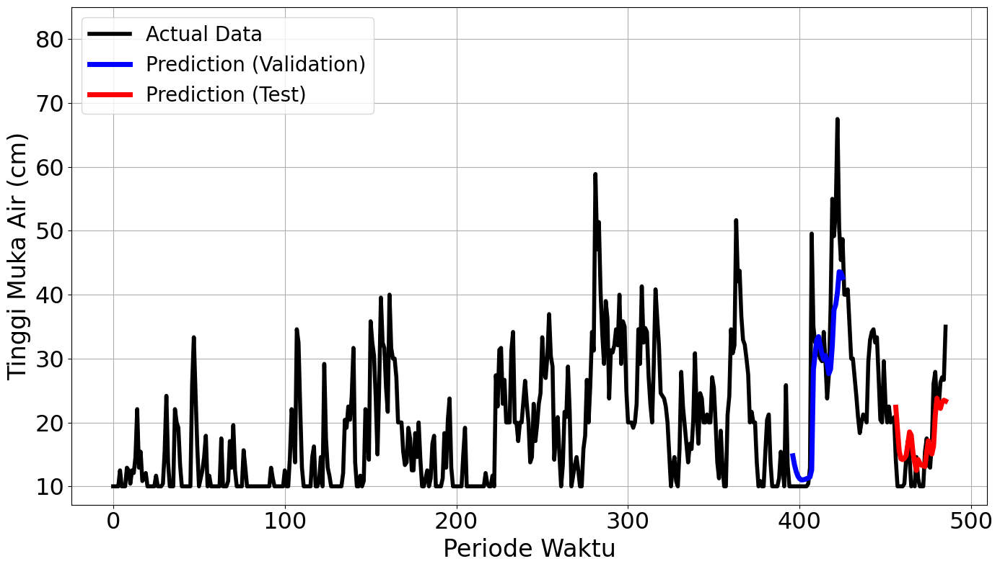

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.2989 - val_loss: 0.1325
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - loss: 0.0465 - val_loss: 2.5726e-04
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0354 - val_loss: 3.3414e-04
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0134 - val_loss: 8.2019e-04
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0097 - val_loss: 1.8424e-04
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0095 - val_loss: 6.4429e-04
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0090 - val_loss: 0.0036
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0103 - val_loss: 2.6110e-04
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0087 - val_loss: 4.1594e-04
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0087Restoring model weights from the end of the best epoch.
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0086 - val_loss: 2.2149e-04
Epoch 00

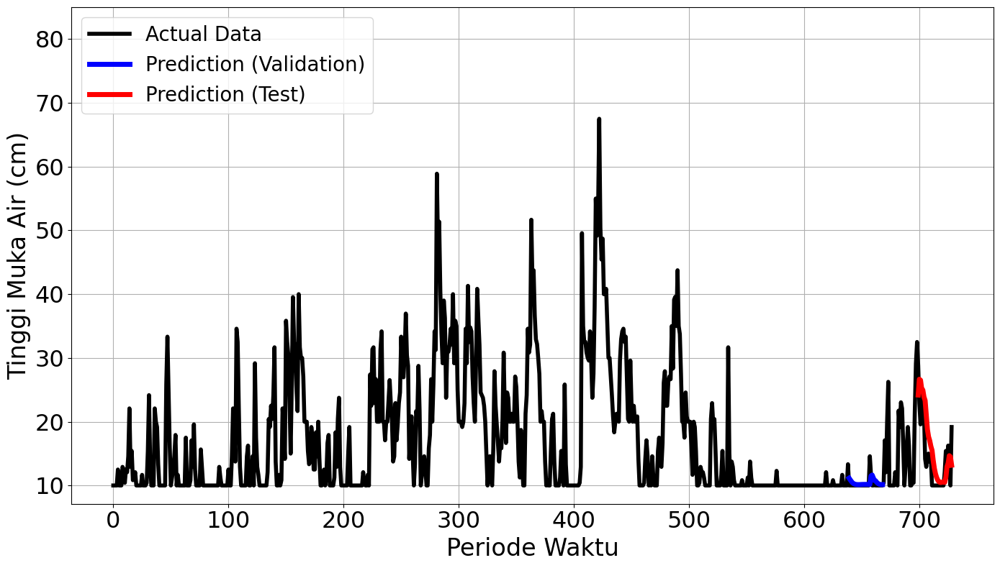

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 134ms/step - loss: 0.2256 - val_loss: 0.0253
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0187 - val_loss: 0.0129
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0146 - val_loss: 0.0054
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0089 - val_loss: 0.0052
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0089 - val_loss: 0.0037
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0077 - val_loss: 0.0046
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0083 - val_loss: 0.0032
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0077 - val_loss: 0.0037
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0069 - val_loss: 0.0043
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0085 - val_loss: 0.0032
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0058 - val_loss: 0.0032
Epoch 12/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.

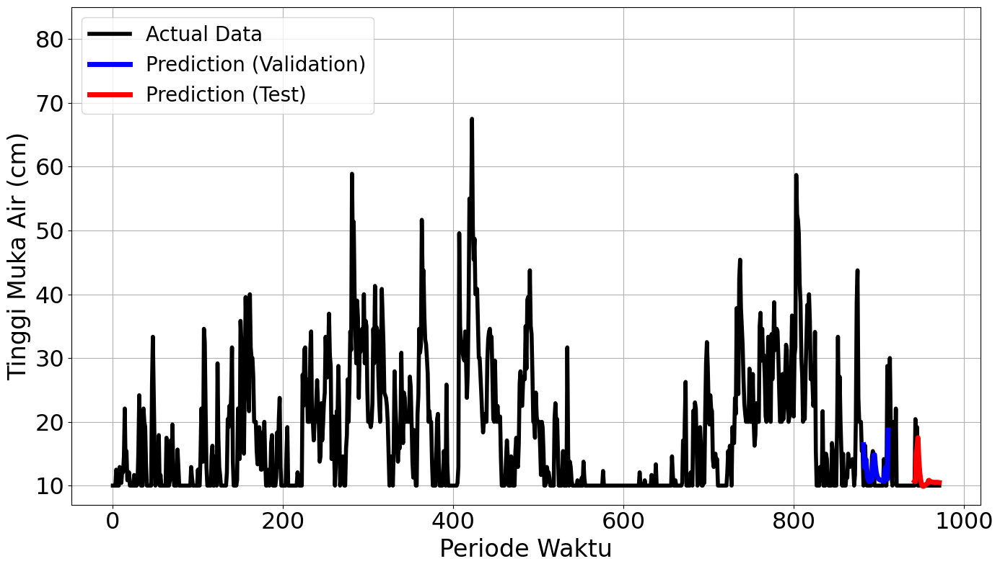

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1780 - val_loss: 0.0294
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0168 - val_loss: 0.0198
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0086 - val_loss: 0.0191
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0070 - val_loss: 0.0168
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - val_loss: 0.0152
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0077 - val_loss: 0.0132
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0080 - val_loss: 0.0128
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0065 - val_loss: 0.0134
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0073 - val_loss: 0.0133
Epoch 10/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0070 - val_loss: 0.0117
Epoch 11/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 12/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0

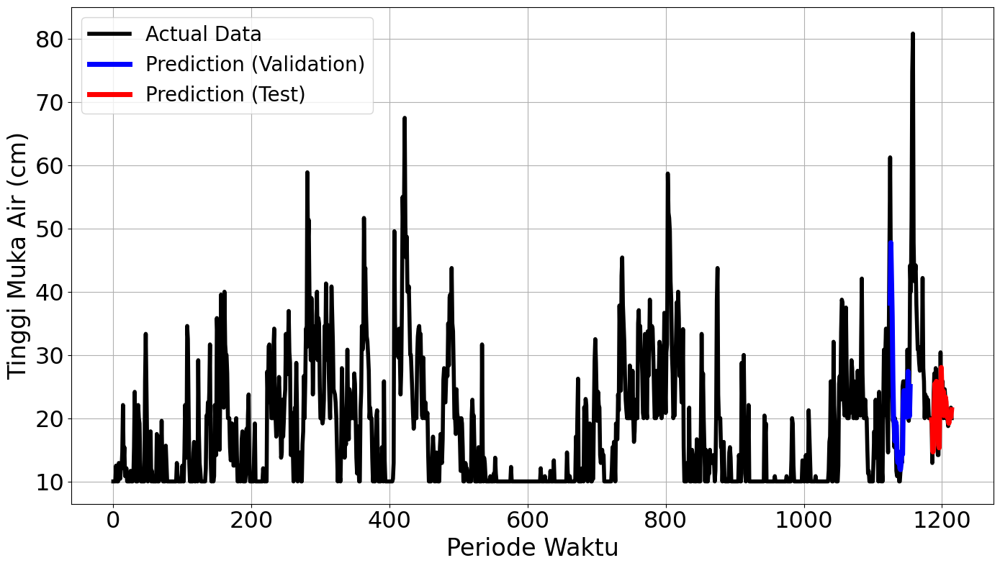

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2328
Final Average MAPE Test: 0.2423
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 745ms/step - loss: 0.6135 - val_loss: 0.1057
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0527 - val_loss: 0.4912
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0756 - val_loss: 0.0940
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0350 - val_loss: 0.0308
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0398 - val_loss: 0.0756
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0107 - val_loss: 0.1755
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0264 - val_loss: 0.1309
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0156 - val_loss: 0.0467
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0188 Restoring model weights from the end of the best epoch.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0210 - val_loss: 0.0380
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
mape validation = 55.204449115202

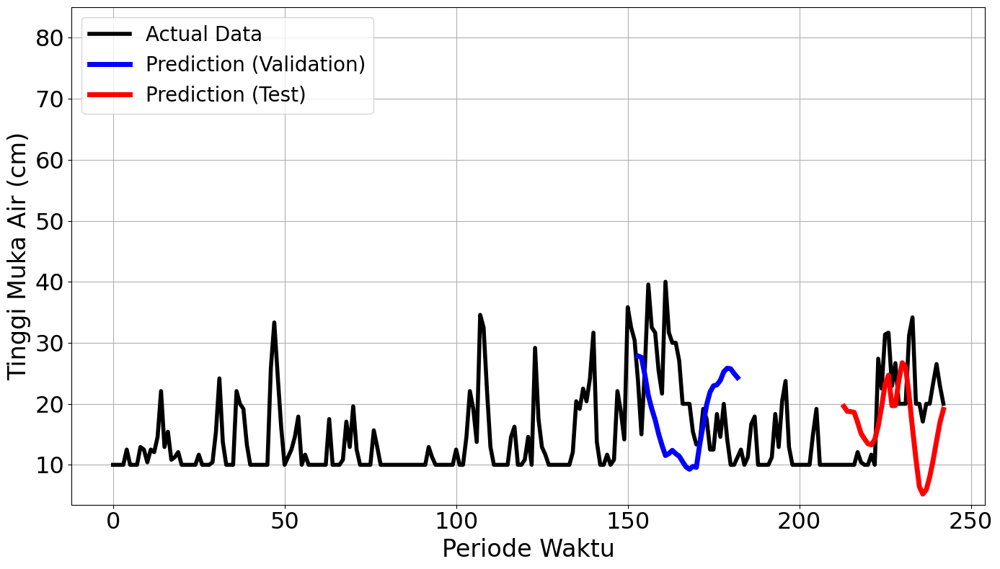

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 215ms/step - loss: 0.1629 - val_loss: 0.0668
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0552 - val_loss: 0.0645
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0279 - val_loss: 0.0769
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0198 - val_loss: 0.0442
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0142 - val_loss: 0.0435
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0173 - val_loss: 0.0390
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0134 - val_loss: 0.0314
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0116 - val_loss: 0.0461
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0115 - val_loss: 0.0405
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0105 - val_loss: 0.0358
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0094 - val_loss: 0.0290
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0094 - val_loss: 0.0366


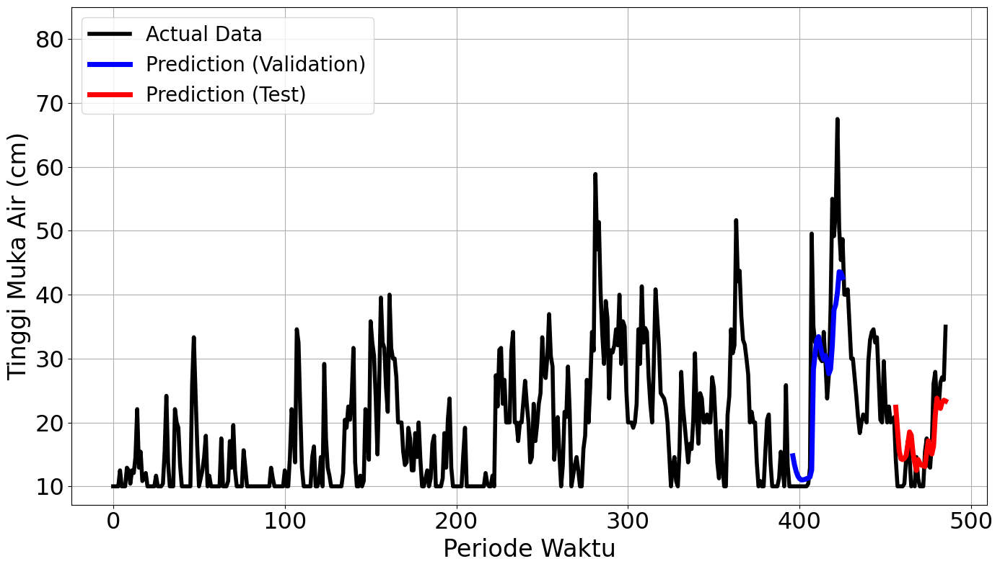

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - loss: 0.2989 - val_loss: 0.1325
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.0465 - val_loss: 2.5726e-04
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0354 - val_loss: 3.3414e-04
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0134 - val_loss: 8.2019e-04
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0097 - val_loss: 1.8424e-04
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - val_loss: 6.4429e-04
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0090 - val_loss: 0.0036
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0103 - val_loss: 2.6110e-04
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0087 - val_loss: 4.1594e-04
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0087Restoring model weights from the end of the best epoch.
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0086 - val_loss: 2.2149e-04
Epoch 00

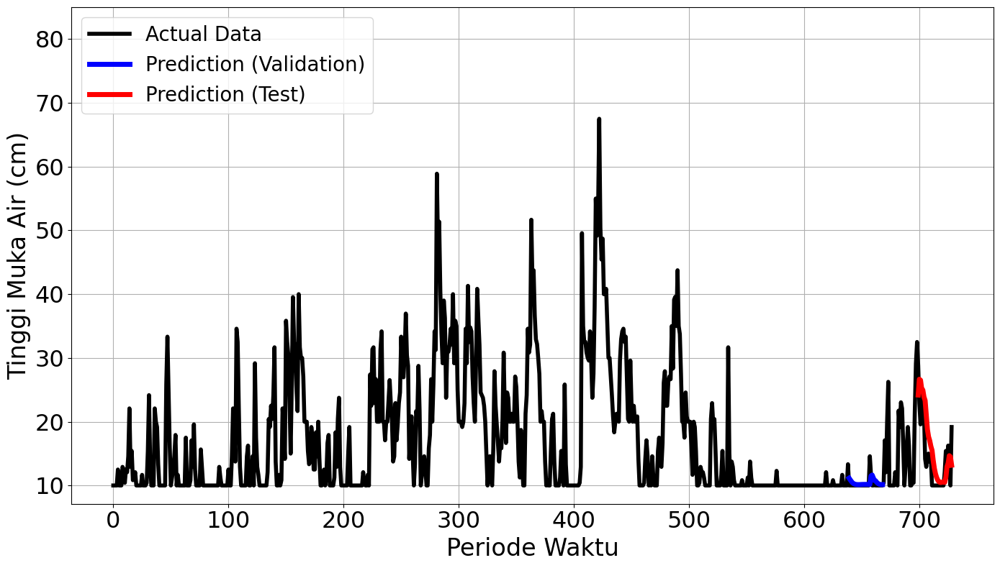

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2256 - val_loss: 0.0253
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0187 - val_loss: 0.0129
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0146 - val_loss: 0.0054
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0089 - val_loss: 0.0052
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0089 - val_loss: 0.0037
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0077 - val_loss: 0.0046
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0083 - val_loss: 0.0032
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0077 - val_loss: 0.0037
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0069 - val_loss: 0.0043
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - val_loss: 0.0032
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0058 - val_loss: 0.0032
Epoch 12/100
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.

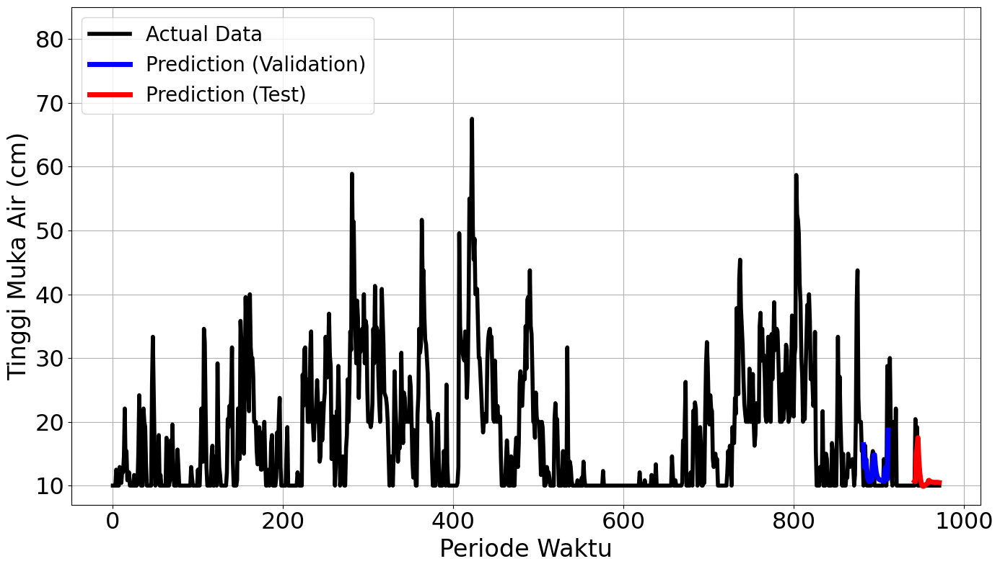

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1780 - val_loss: 0.0294
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0168 - val_loss: 0.0198
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0086 - val_loss: 0.0191
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0070 - val_loss: 0.0168
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0090 - val_loss: 0.0152
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0077 - val_loss: 0.0132
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0080 - val_loss: 0.0128
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0065 - val_loss: 0.0134
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0073 - val_loss: 0.0133
Epoch 10/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0070 - val_loss: 0.0117
Epoch 11/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0066 - val_loss: 0.0113
Epoch 12/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0

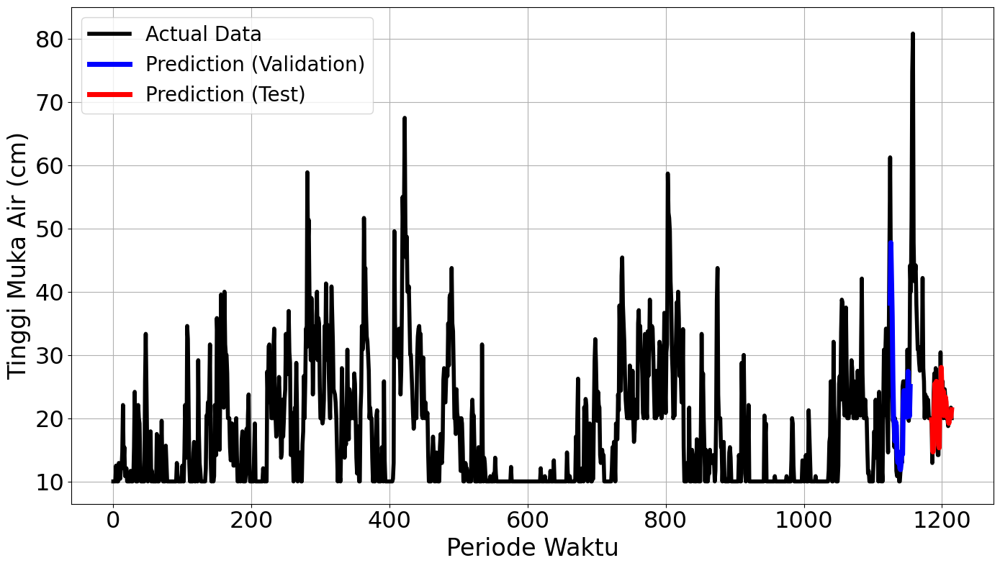

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2328
Final Average MAPE Test: 0.2423
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.5838 - val_loss: 0.1007
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0349 - val_loss: 0.1040
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - loss: 0.0278 - val_loss: 0.2628
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - loss: 0.0330 - val_loss: 0.1497
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step - loss: 0.0099 - val_loss: 0.1011
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - loss: 0.0186Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - loss: 0.0186 - val_loss: 0.1400
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
mape validation = 91.84232092404999 %
mape test = 95.35967914962042 %


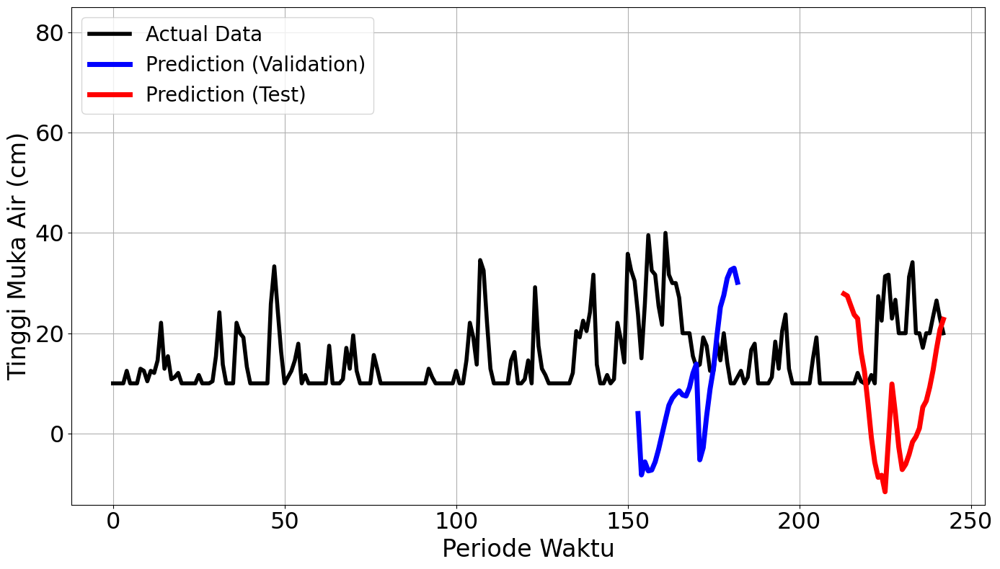

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 454ms/step - loss: 0.3143 - val_loss: 0.3010
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 172ms/step - loss: 0.1251 - val_loss: 0.0544
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0626 - val_loss: 0.1681
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step - loss: 0.0597 - val_loss: 0.0411
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0313 - val_loss: 0.0406
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - loss: 0.0194 - val_loss: 0.0732
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0213 - val_loss: 0.0573
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0159 - val_loss: 0.0278
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.0161 - val_loss: 0.0278
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0113 - val_loss: 0.0368
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0129 - val_loss: 0.0294
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0099 - val_los

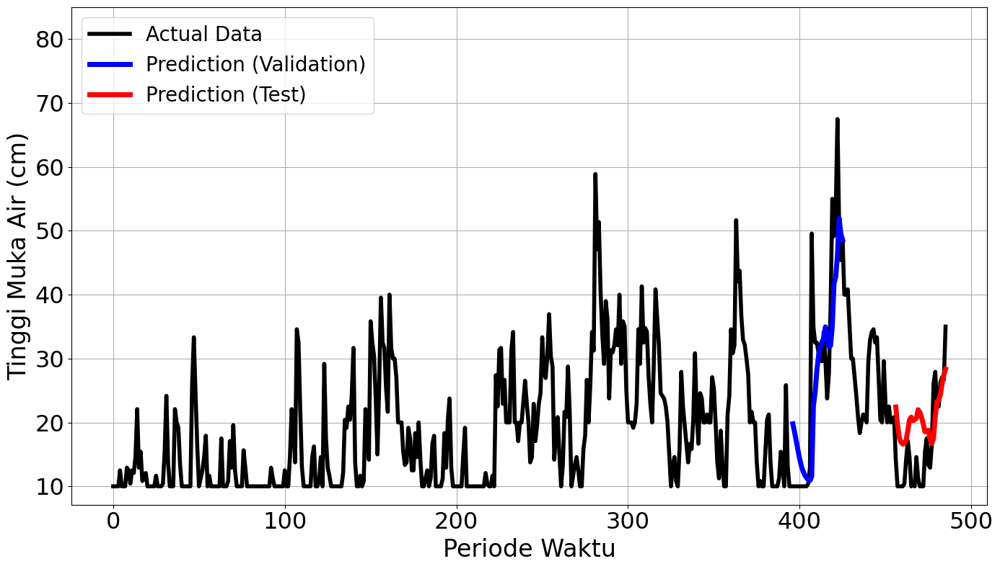

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 300ms/step - loss: 0.2489 - val_loss: 0.0174
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0374 - val_loss: 0.0172
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0233 - val_loss: 2.8943e-04
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.0192 - val_loss: 6.3753e-04
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0182 - val_loss: 1.9337e-04
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0144 - val_loss: 5.3935e-04
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0134 - val_loss: 0.0028
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0139 - val_loss: 0.0195
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0158 - val_loss: 0.0011
Epoch 10/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0104 - val_loss: 1.8087e-04
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0110 - val_loss: 2.5019e-04
Epoch 12/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 

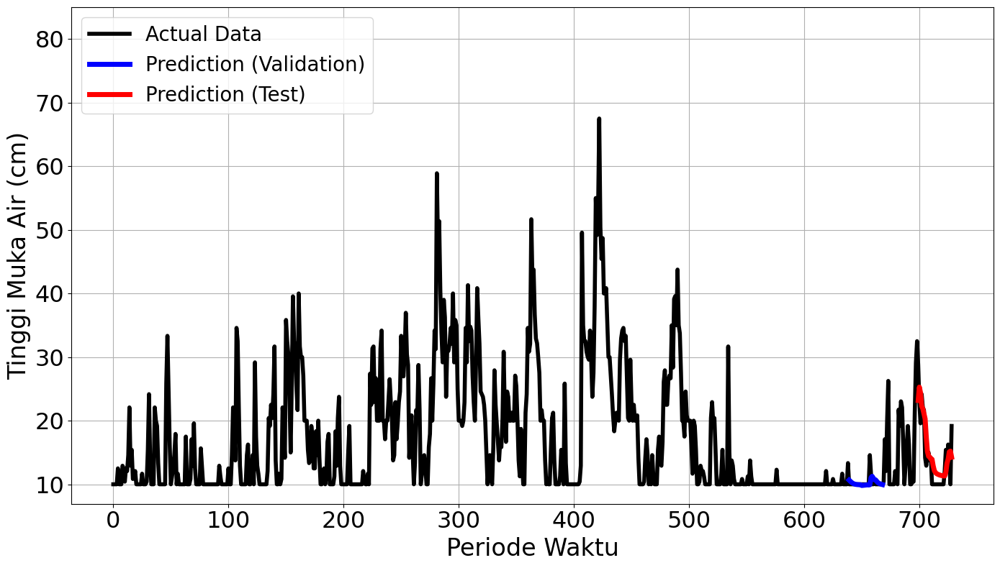

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 197ms/step - loss: 0.2377 - val_loss: 0.0652
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.0428 - val_loss: 0.0390
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0304 - val_loss: 0.0067
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0175 - val_loss: 0.0104
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0130 - val_loss: 0.0059
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0115 - val_loss: 0.0058
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0079 - val_loss: 0.0052
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0091 - val_loss: 0.0046
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0086 - val_loss: 0.0044
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0078 - val_loss: 0.0043
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0066 - val_loss: 0.0036
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0073 - val_loss: 0.0035

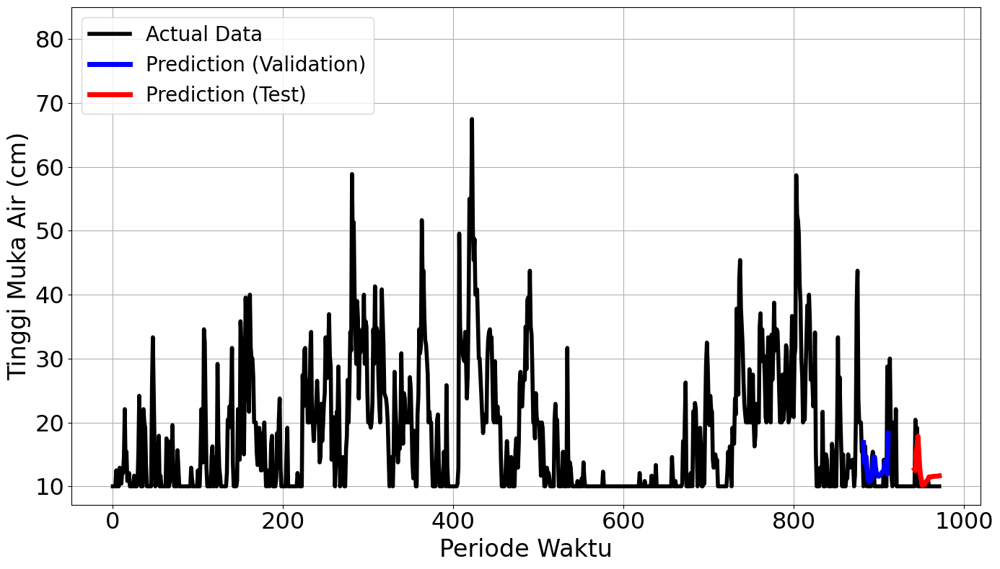

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 184ms/step - loss: 0.1888 - val_loss: 0.0639
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0337 - val_loss: 0.0197
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0212 - val_loss: 0.0181
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0081 - val_loss: 0.0204
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0083 - val_loss: 0.0171
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0082 - val_loss: 0.0150
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0065 - val_loss: 0.0143
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0060 - val_loss: 0.0139
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0073 - val_loss: 0.0134
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0072 - val_loss: 0.0131
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0055 - val_loss: 0.0127
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0073 - val_loss: 0.0122


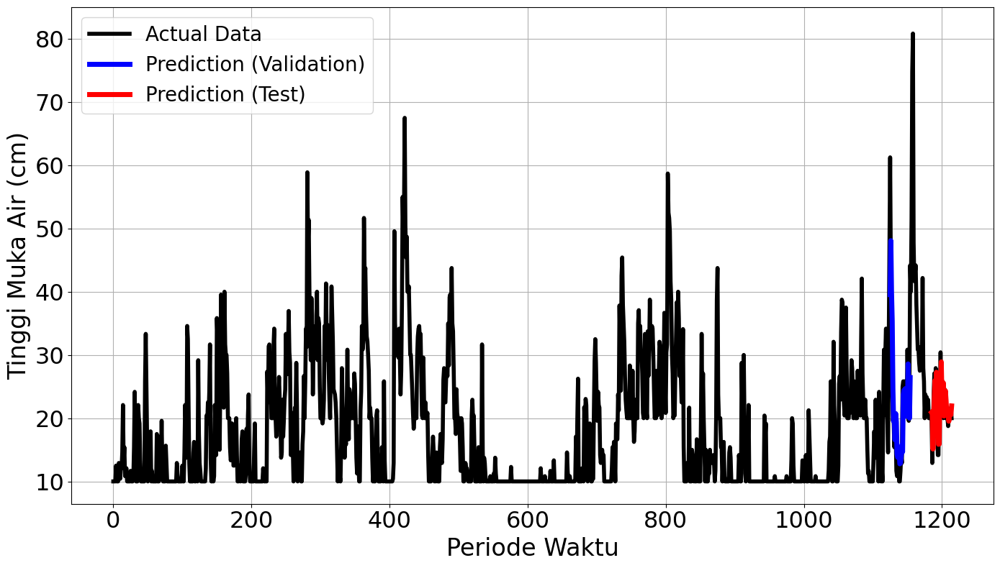

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3322
Final Average MAPE Test: 0.3884
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step - loss: 0.5838 - val_loss: 0.1007
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - loss: 0.0349 - val_loss: 0.1040
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.0278 - val_loss: 0.2628
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step - loss: 0.0330 - val_loss: 0.1497
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step - loss: 0.0099 - val_loss: 0.1011
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0186Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - loss: 0.0186 - val_loss: 0.1400
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
mape validation = 91.84232092404999 %
mape test = 95.35967914962042 %


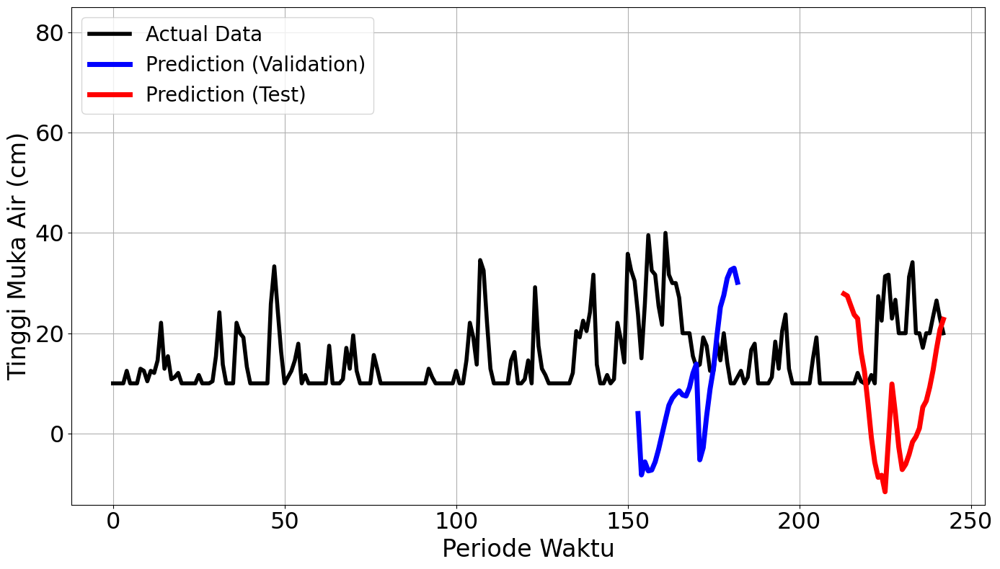

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 450ms/step - loss: 0.3143 - val_loss: 0.3010
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1251 - val_loss: 0.0544
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.0626 - val_loss: 0.1681
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.0597 - val_loss: 0.0411
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0313 - val_loss: 0.0406
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0194 - val_loss: 0.0732
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0213 - val_loss: 0.0573
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0159 - val_loss: 0.0278
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.0161 - val_loss: 0.0278
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0113 - val_loss: 0.0368
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0129 - val_loss: 0.0294
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0099

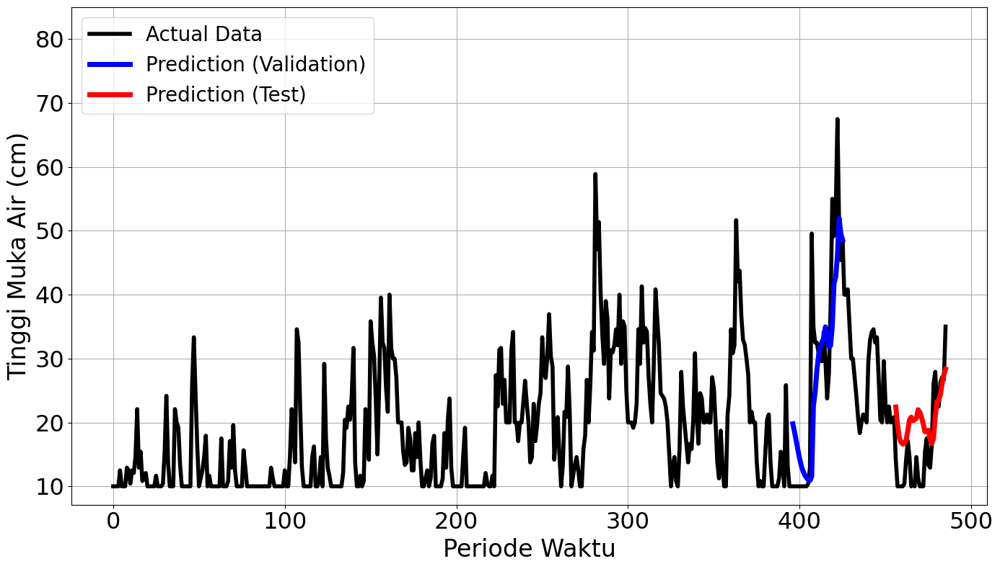

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.2489 - val_loss: 0.0174
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0374 - val_loss: 0.0172
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0233 - val_loss: 2.8943e-04
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0192 - val_loss: 6.3753e-04
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step - loss: 0.0182 - val_loss: 1.9337e-04
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0144 - val_loss: 5.3935e-04
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.0134 - val_loss: 0.0028
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.0139 - val_loss: 0.0195
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0158 - val_loss: 0.0011
Epoch 10/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - loss: 0.0104 - val_loss: 1.8087e-04
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0110 - val_loss: 2.5019e-04
Epoch 12/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - 

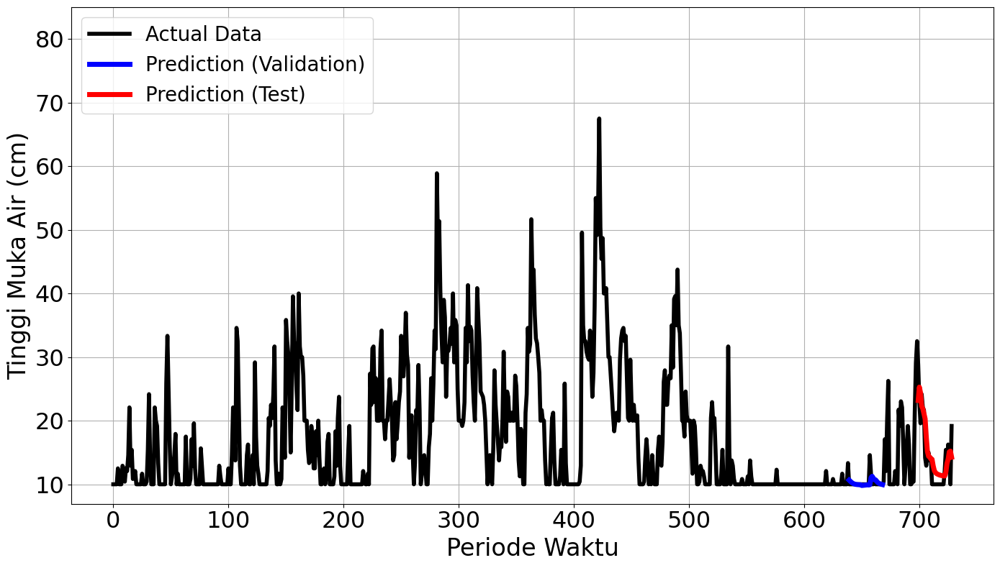

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - loss: 0.2377 - val_loss: 0.0652
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.0428 - val_loss: 0.0390
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.0304 - val_loss: 0.0067
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0175 - val_loss: 0.0104
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.0130 - val_loss: 0.0059
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0115 - val_loss: 0.0058
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0079 - val_loss: 0.0052
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0091 - val_loss: 0.0046
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0086 - val_loss: 0.0044
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0078 - val_loss: 0.0043
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0066 - val_loss: 0.0036
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0073 - val_loss: 0.0035

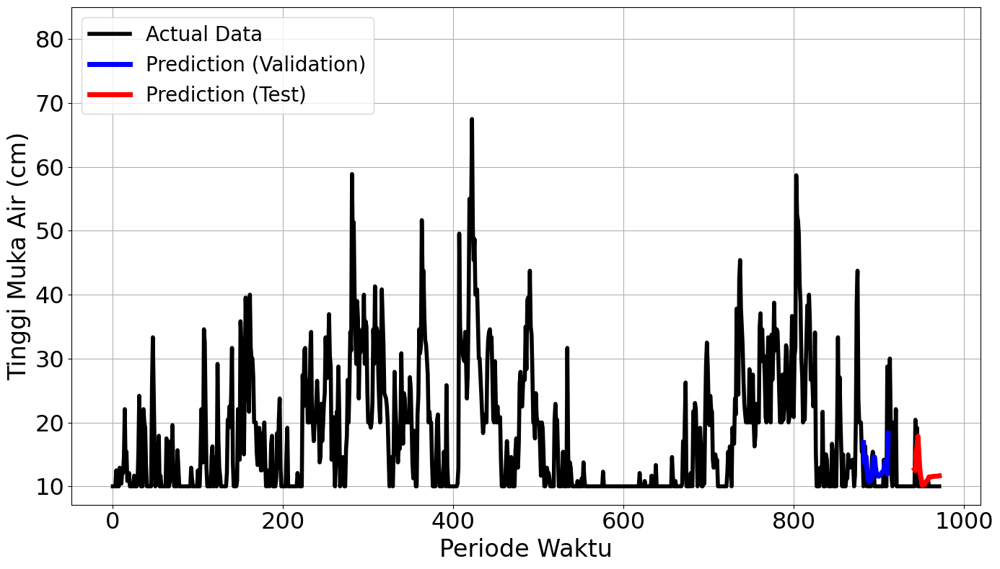

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.1888 - val_loss: 0.0639
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0337 - val_loss: 0.0197
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.0212 - val_loss: 0.0181
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0081 - val_loss: 0.0204
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.0083 - val_loss: 0.0171
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0082 - val_loss: 0.0150
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0065 - val_loss: 0.0143
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0060 - val_loss: 0.0139
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0073 - val_loss: 0.0134
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0072 - val_loss: 0.0131
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0055 - val_loss: 0.0127
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0073 - val_loss: 0.0122


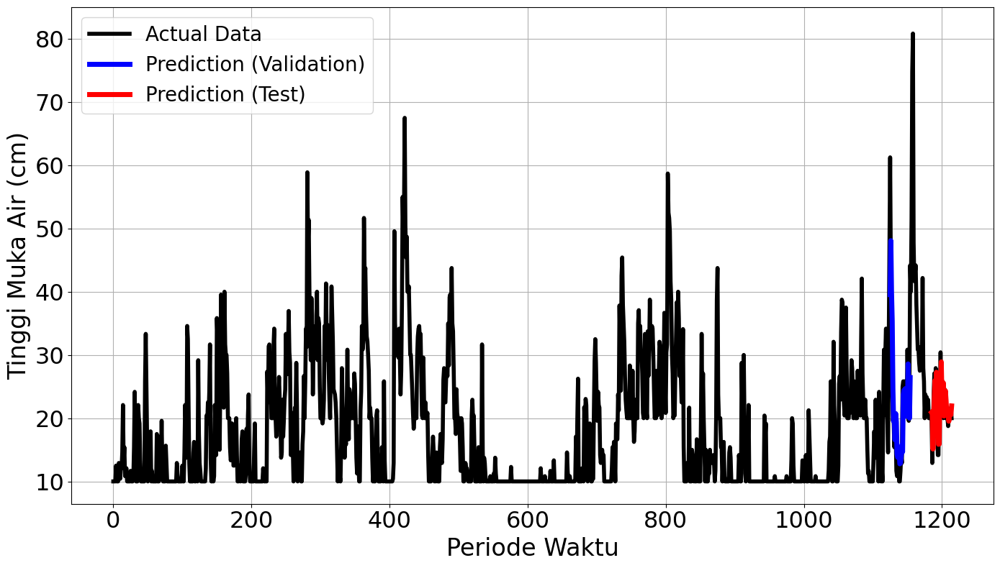

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3322
Final Average MAPE Test: 0.3884


In [10]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Parameter expanding window
window_size = 243
n_test = 60
n_train_and_val = window_size - n_test
n_train = n_train_and_val - 60
shift = 243
n_windows1 = 5
n_total = len(data_series)
look_back = 30
time_step = 30

import itertools

config_params = {
    "learning_rate" : [0.001, 0.005],
    "batch_size" : [1, 16, 64, 128],
    "neurons" : [50],
    "init_scheme": ['he_uniform', 'glorot_uniform']
}

average_mape_vals_by_param = []
average_mape_tests_by_param = []

for xs in itertools.product(*list(config_params.values())):
  current_param = dict()
  for i, key in enumerate(config_params.keys()):
    if key == "batch_size":
      bsize = xs[i]
    else:
      current_param[key] = xs[i]

  mape_vals = []
  mape_tests = []

  # Simpan nilai asli
  base_n_train = n_train
  base_n_train_and_val = n_train_and_val

  for i in range(n_windows1):
    current_n_train = base_n_train + i * shift
    current_n_train_and_val = base_n_train_and_val + i * shift
    end = current_n_train_and_val + n_test

    if end > n_total:
        print(f"Window {i+1} tidak dapat dibuat karena melebihi batas data.")
        break

    window_data = data_series[:end]  # expanding window
    train_and_val = window_data[:current_n_train_and_val]
    train = train_and_val[:current_n_train]
    val = train_and_val[current_n_train:]
    test = window_data[current_n_train_and_val:]

    try:

          train_generator = TimeseriesGenerator(train, train, length=look_back, batch_size=bsize)

          val_generator = TimeseriesGenerator(val, val, length=look_back, batch_size=bsize)

          test_generator = TimeseriesGenerator(test, test, length=look_back, batch_size=bsize)

          model = create_model(current_param['neurons'], current_param['learning_rate'])

          # model.compile(optimizer='adam', loss='mean_squared_error')

          model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[EarlyStoppingAtMinLoss(patience=5)], verbose = 1)

          val_predictions = model.predict(val_generator)
          test_predictions  = model.predict(test_generator)

          val_predictions_descale = scaler.inverse_transform(val_predictions).flatten()
          test_predictions_descale = scaler.inverse_transform(test_predictions).flatten()

          train_actual = scaler.inverse_transform(train).flatten()
          val_actual = scaler.inverse_transform(val).flatten()
          test_actual = scaler.inverse_transform(test).flatten()

          all_actual = np.append(np.append(train_actual, val_actual), test_actual)

          val_true = val[look_back:]
          val_true_descale = scaler.inverse_transform(val_true).flatten()
          mape_val = mean_absolute_percentage_error(val_true_descale, val_predictions_descale)

          test_true = test[look_back:]
          test_true_descale = scaler.inverse_transform(test_true).flatten()
          mape_test = mean_absolute_percentage_error(test_true_descale, test_predictions_descale)

          mape_vals.append(mape_val)
          mape_tests.append(mape_test)

          print(f"mape validation = {mape_val * 100} %")
          print(f"mape test = {mape_test * 100} %")

          # X_actual = np.arange(0, len(train) + len(val) + len(test))
          # X_train = np.arange(0, len(train))
          # X_val = np.arange(len(train) + look_back, len(train) + len(val))
          # X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          X_actual = np.arange(len(train) + len(val) + len(test))
          X_val = np.arange(len(train) + look_back, len(train) + len(val))
          X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          # axs[i].plot(X_actual, all_actual, lw=2, color='black', label='actual data')
          # axs[i].plot(X_val, val_predictions_descale, lw=2.5, color='blue', label='prediction validation')
          # axs[i].plot(X_test, test_predictions_descale, lw=2.5, color='red', label='prediction test')
          # axs[i].set_title(f'Window {i+1}')
          # axs[i].legend(loc='upper left') # legend untuk setiap subplot window
          plt.figure(figsize=(14, 8))
          plt.plot(X_actual, all_actual, lw=4, color='black', label='Actual Data')
          plt.plot(X_val, val_predictions_descale, lw=5, color='blue', label='Prediction (Validation)')
          plt.plot(X_test, test_predictions_descale, lw=5, color='red', label='Prediction (Test)')
          # plt.title(f'Window {i+1}', fontsize=25)
          plt.xlabel('Periode Waktu', fontsize=24)
          plt.ylabel('Tinggi Muka Air (cm)', fontsize=24)
          plt.ylim(top=85)
          plt.tick_params(axis='both', labelsize=23)
          # plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
          plt.legend(loc='upper left', fontsize=20)
          plt.grid(True)
          plt.tight_layout()
          plt.show()

    except Exception as e:
          print(f"Error pada Window {i+1}: {e}")
          continue

  # setelah proses looping selesai
  plt.tight_layout(rect=[0, 0, 1, 0.97])  # agar suptitle tidak ketiban
  plt.show()

  # Rata-rata MAPE akhir
  if mape_vals and mape_tests:
      final_mape_val = np.mean(mape_vals)
      final_mape_test = np.mean(mape_tests)
      print(f"\nFinal Average MAPE Validation: {final_mape_val:.4f}")
      print(f"Final Average MAPE Test: {final_mape_test:.4f}")
      average_mape_vals_by_param.append(final_mape_val)
      average_mape_tests_by_param.append(final_mape_test)

### Hyperparameter Summary (EWCV)

In [11]:
# 1. Buat semua kombinasi hyperparameter
parameter_combinations = list(itertools.product(*config_params.values()))

# 2. Buat DataFrame ringkasan dengan kolom nilai MAPE dan kombinasi param
hyperparameter_summary = pd.DataFrame({
    "mape_vals": average_mape_vals_by_param,
    "mape_tests": average_mape_tests_by_param,
    "param_combo": parameter_combinations  # Masukkan kombinasi ke kolom DataFrame
})

# 3. Urutkan berdasarkan mape_tests (terkecil ke terbesar)
hyperparameter_summary_sorted = hyperparameter_summary.sort_values(by="mape_tests").reset_index(drop=True)

# 4. Ubah param_combo (tuple) menjadi dict agar readable
hyperparameter_summary_sorted["param_dict"] = hyperparameter_summary_sorted["param_combo"].apply(
    lambda combo: {k: combo[i] for i, k in enumerate(config_params.keys())}
)

# 5. Tampilkan seluruh kombinasi dalam urutan performa terbaik
for i, row in hyperparameter_summary_sorted.iterrows():
    print(f"Rank {i+1}:")
    print(f"  MAPE (val):  {row['mape_vals']:.6f}")
    print(f"  MAPE (test): {row['mape_tests']:.6f}")
    print(f"  Params:      {row['param_dict']}")
    print("-" * 40)

Rank 1:
  MAPE (val):  0.191882
  MAPE (test): 0.220277
  Params:      {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
----------------------------------------
Rank 2:
  MAPE (val):  0.191882
  MAPE (test): 0.220277
  Params:      {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------
Rank 3:
  MAPE (val):  0.232780
  MAPE (test): 0.242332
  Params:      {'learning_rate': 0.005, 'batch_size': 64, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------
Rank 4:
  MAPE (val):  0.232780
  MAPE (test): 0.242332
  Params:      {'learning_rate': 0.005, 'batch_size': 64, 'neurons': 50, 'init_scheme': 'glorot_uniform'}
----------------------------------------
Rank 5:
  MAPE (val):  0.199553
  MAPE (test): 0.263550
  Params:      {'learning_rate': 0.005, 'batch_size': 16, 'neurons': 50, 'init_scheme': 'he_uniform'}
----------------------------------------

### Best Parameter (EWCV)

In [12]:
best_param = {'learning_rate': 0.005, 'batch_size': 1, 'neurons': 50, 'init_scheme': 'glorot_uniform'}

In [13]:
def create_model(neurons, learning_rate, init_scheme='glorot_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        kernel_initializer=init_scheme,
        input_shape=(time_step, 1)
    ))
    model.add(Dropout(0.01))
    model.add(Dense(1))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [14]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Data/Data%20TMA%20(Jan%202022%20-%20Mei%202025).csv')
data = data.loc[:, ['Daily_Period', 'TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

train_data = data.iloc[:1095]
val_data = data.iloc[1095:1155]
test_data = data.iloc[1155:]

# Mengambil kolom 'TMA_Daily' sebagai data yang akan diprediksi
time_series_data = data['TMA_Daily'].values.reshape(-1, 1)

# Normalisasi data ke rentang 0-1
scaler = MinMaxScaler()
time_series_data = scaler.fit_transform(time_series_data)

# Menentukan ukuran dataset
train_size = 1095
val_size = 60
test_size = len(time_series_data) - train_size - val_size

# Membagi data menjadi train, val, test
train_data = time_series_data[:train_size]
val_data = time_series_data[train_size:train_size+val_size]
test_data = time_series_data[train_size+val_size:]

# Fungsi untuk membuat dataset dengan sekuens deret waktu
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i : i + seq_length])
    return np.array(sequences)

# Panjang sekuens deret waktu
seq_length = 30

# Membuat dataset sekuens
X_train = create_sequences(train_data, seq_length)
X_val = create_sequences(val_data, seq_length)
X_test = create_sequences(test_data, seq_length)

# Memisahkan fitur dan target
y_train = X_train[:, -1]
X_train = X_train[:, :-1]

y_val = X_val[:, -1]
X_val = X_val[:, :-1]

y_test = X_test[:, -1]
X_test = X_test[:, :-1]

# Reshape untuk input LSTM (samples, time steps, features)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

model = create_model(best_param['neurons'],
                     best_param['learning_rate'],
                     best_param.get('init_scheme', 'glorot_uniform')
)
history = model.fit(
    X_train, y_train,
    epochs=40,
    batch_size=1,
    validation_data=(X_val, y_val),
    verbose=10)

Epoch 1/40


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/40
Epoch 3/40
Epoch 4/40
Epoch 5/40
Epoch 6/40
Epoch 7/40
Epoch 8/40
Epoch 9/40
Epoch 10/40
Epoch 11/40
Epoch 12/40
Epoch 13/40
Epoch 14/40
Epoch 15/40
Epoch 16/40
Epoch 17/40
Epoch 18/40
Epoch 19/40
Epoch 20/40
Epoch 21/40
Epoch 22/40
Epoch 23/40
Epoch 24/40
Epoch 25/40
Epoch 26/40
Epoch 27/40
Epoch 28/40
Epoch 29/40
Epoch 30/40
Epoch 31/40
Epoch 32/40
Epoch 33/40
Epoch 34/40
Epoch 35/40
Epoch 36/40
Epoch 37/40
Epoch 38/40
Epoch 39/40
Epoch 40/40


### Plot Model Loss

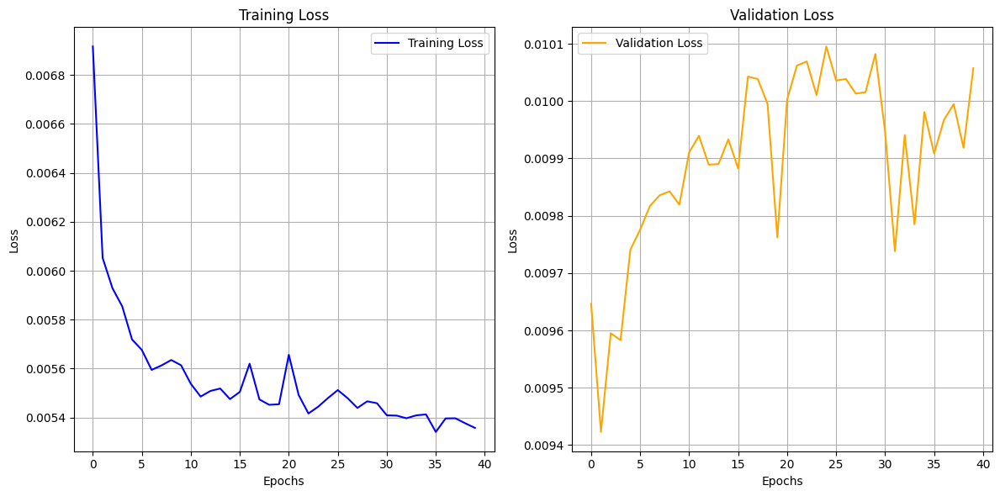

In [15]:
import matplotlib.pyplot as plt

# Membuat subplot 1 baris 2 kolom
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Subplot kiri: Training Loss
axs[0].plot(history.history['loss'], label='Training Loss', color='blue')
axs[0].set_title('Training Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].grid(True)
axs[0].legend()

# Subplot kanan: Validation Loss
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='orange')
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].grid(True)
axs[1].legend()

# Tata letak rapat
plt.tight_layout()
plt.show()

### MAPE Train

In [16]:
def inverse_transform(scaler, input):
  return input * (scaler.data_max_[0] - scaler.data_min_[0]) + scaler.data_min_[0]

# inverse_transform(scaler, predicted)

In [17]:
train_predict = model.predict(X_train).flatten()
train_predict_denorm = inverse_transform(scaler, train_predict)
y_train_denorm = inverse_transform(scaler, y_train)
mape_train = mean_absolute_percentage_error(y_train_denorm, train_predict_denorm)
mape_train

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


0.22614205990354758

### Plot Train Actual vs Predicted

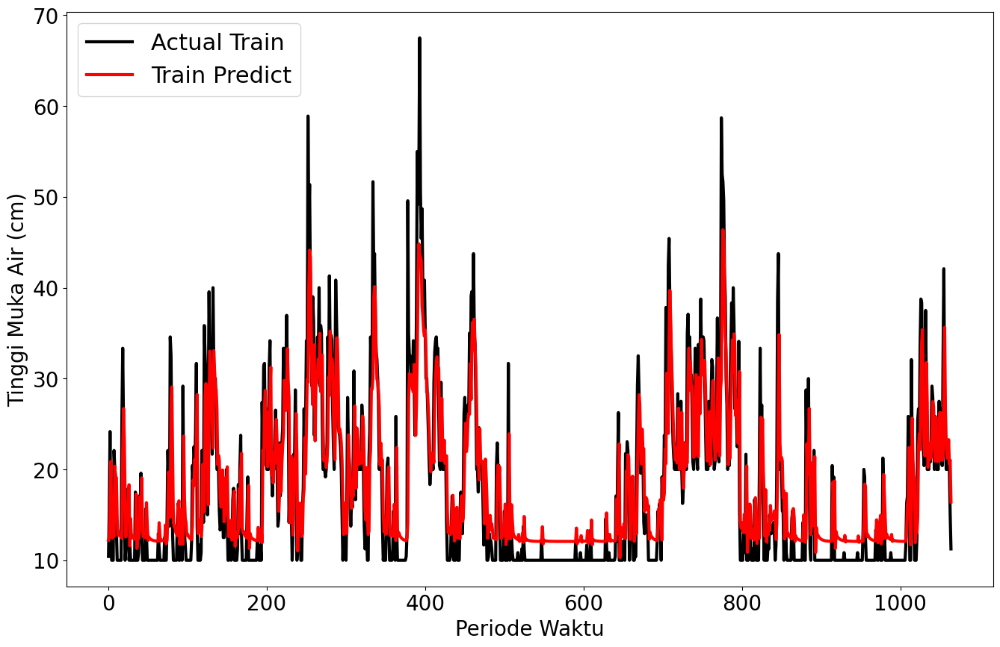

In [18]:
# Plot perbandingan actual train dan train predict

plt.figure(figsize=(16, 10))

plt.plot(y_train_denorm, lw=3, label='Actual Train', color = 'black')
plt.plot(train_predict_denorm, lw=3, label='Train Predict', color = 'red')
# plt.title('Perbandingan Actual Train dan Train Predict')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Periode Waktu', fontsize=20)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=20)
plt.legend(loc = 'upper left', fontsize = 22)
plt.show()